<h1>Arabic Dialect Classifier<span class="tocSkip"></span></h1>
<h2>Can we predict the dialect of an Arabic tweet?<span class="tocSkip"></span></h2>
<br/>

#### MSA vs Dialect
STEP 1 - Preparing Dataset
* Importing Datasets
* Labelling Dataset
* Cleaning Latin characters
* Normalising
* Transliterating
* Removing punctuation
* Dediacritising

STEP 2 - Analysing Data and Tokenisation
* EDA - WordClouds
* CamelTools in-built Classifier
* Tokenisation

STEP 3 - Modelling and Exploring Findings
* Naive Bayes Models
* NB coefficient analysis
* Logistic Regression Models
* LG coefficient analysis
* Classification reports, Confusion Matrices and curves
* L1 Regularised Logistic Regression
* Making coefficient wordclouds (in Arabic!)
* Predicting from one input

#### Dialect Classifier

STEP 1 - Preparing Dataset
* Relabelling
* Cleaning and preparing Arabic
* Vectorising
* Exporting

STEP 2 - Modelling and Exploring Findings
* Baseline analysis
* Naive Bayes CVEC
* Naive Bayes TFIDF
* N-gram comparisons
* Classification reports, Confusion Matrices and curves
* Logistic Regression
* Coefficient Analysis
* Morphological Tokenisation
* Oversampling
* Morphtok with NB CVEC
* Morphtok with NB TF-IDF
* LG with Morphtok and Oversampling
* RandomForests with Morphtok and Oversampling
* XGBoost with Morphtok
* XGBoost with Morphtok and Oversampling.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import camel_tools
import warnings
from camel_tools.utils.dediac import dediac_safebw
from camel_tools.utils.charmap import CharMapper
from camel_tools.utils.transliterate import Transliterator
from camel_tools.utils import normalize
from camel_tools.dialectid import DialectIdentifier
import scipy.sparse
import re
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold, StratifiedKFold, RandomizedSearchCV
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
import scikitplot as skplt
import arabic_reshaper
from bidi.algorithm import get_display
import os
import codecs
import scipy.sparse
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MaxAbsScaler
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbPipeline
from sklearn.decomposition import IncrementalPCA, PCA, TruncatedSVD
from sklearn.utils.extmath import randomized_svd
from xgboost import XGBClassifier
from camel_tools.disambig.mle import MLEDisambiguator
from camel_tools.tokenizers.morphological import MorphologicalTokenizer
from camel_tools.tokenizers.word import simple_word_tokenize

In [3]:
warnings.filterwarnings("ignore")

<a id=’msavdialect’></a>
# MSA vs Dialect

#### Importing Datasets
Here we import our two datasets - one for MSA and one for Dialect. 
There exists a test dataset - but I'm jsut going to use a train-test split for the initial modelling.

In [4]:
MSA_train = pd.read_csv('data/NADI2021_DEV.1.0/Subtask_1.1+2.1_MSA/MSA_train_labeled.tsv', sep='\t')

In [5]:
MSA_train.head()

,#1_tweetid,#2_tweet,#3_country_label,#4_province_label
0,TRAIN_0,زيدان كان مؤثر اكثر,Iraq,iq_Ninawa
1,TRAIN_1,اريد تحطيم الرقم القياسي في الضحك ... ;) !,Algeria,dz_Biskra
2,TRAIN_2,كل لحظاتي في 2014 جميلة #اجمل_لحظه_عندك,Bahrain,bh_Capital
3,TRAIN_3,عن دقة ملاحظتك ماشاءالله,Somalia,so_Banaadir
4,TRAIN_4,The Conjuring 2.. Mbc2 جاهزون يا أبطال.!,Egypt,eg_Faiyum


In [6]:
#Importing Dialect Dataset
D_train = pd.read_csv('data/NADI2021_DEV.1.0/Subtask_1.2+2.2_DA/DA_train_labeled.tsv', sep='\t')

In [7]:
D_train.head()

,#1_tweetid,#2_tweet,#3_country_label,#4_province_label
0,TRAIN_0,حاجة حلوة اكيد,Egypt,eg_Faiyum
1,TRAIN_1,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,Iraq,iq_Dihok
2,TRAIN_2,ابشر طال عمرك,Saudi_Arabia,sa_Ha'il
3,TRAIN_3,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,Mauritania,mr_Nouakchott
4,TRAIN_4,شهرين وتروح والباقي غير صيف ملينا,Algeria,dz_El-Oued


#### Labelling Dataset

Our first model will diffrentiate MSA from Dialect. We will label our data points accordingly.

In [8]:
#Labelling Dialect and MSA
D_train['MSA?'] = 0

In [9]:
MSA_train['MSA?'] = 1

In [10]:
# combine the two datasets
dmsa = pd.concat([D_train, MSA_train])[['#2_tweet', 'MSA?']].reset_index(drop=True)

In [11]:
dmsa

,#2_tweet,MSA?
0,حاجة حلوة اكيد,0
1,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,0
2,ابشر طال عمرك,0
3,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,0
4,شهرين وتروح والباقي غير صيف ملينا,0
...,...,...
41995,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,1
41996,سيحاسب عن كل ما فعله أمام رب العالمين,1
41997,#نوفمبر_الإستقلال #حراك_1_نوفمبر من يتقن الكتا...,1
41998,الله رائعه الكلمات,1


#### Cleaning Latin characters

The presence of Latin characters will mess with transliteration later on.
There are other ways to ensureour dataset only includes Arabic but this was the simplest - and I found it effective. 

In [12]:
# check if there are non-arabic letters - this might disrupt our later tokenisation
dmsa['eng?'] =  dmsa['#2_tweet'].apply(lambda x : bool(re.match("[A-z]", x)))

In [13]:
dmsa[dmsa['eng?']==True]

,#2_tweet,MSA?,eng?
111,DW قناه تناطل لاجل بس الحقیق لملایین البشر بما...,0,True
115,Retweeted بنت بغداد ( USER ): USER احبها لان...,0,True
416,J'aime une vidéo USER de USER - Choufli 7a...,0,True
649,Me to me : ما تيجي نسيب كل ده وننام,0,True
793,Hazard recognition &control أحسن شي تجي متأخر ...,0,True
...,...,...,...
41615,Retweeted 200.000 ( USER ): خطب أحد الأمراء ق...,1,True
41627,"Ilahow Adiga Ilaah kale ma jiro, لا اله الا ان...",1,True
41790,Heo young saeng from [Kchan_tv] twitter update...,1,True
41803,"Sidaad ooga warqabtaanba, waxay Khamiisti ina ...",1,True


In [14]:
dmsa.columns = ['tweet', 'msa', 'eng']

In [15]:
# Let's write a function that gets rid of latin letters
def nolatin(string):
    return re.sub('[A-z]', '', string)
    
nolatin("DW قناه تناطل لاجل بس الحقیق لملایین البشر بما...")

' قناه تناطل لاجل بس الحقیق لملایین البشر بما...'

In [16]:
dmsa['nolatin'] = dmsa['tweet'].apply(nolatin)

In [17]:
dmsa['eng?'] =  dmsa['nolatin'].apply(lambda x : bool(re.match("[A-z]", x)))

In [18]:
dmsa[dmsa['eng?']==True]

,tweet,msa,eng,nolatin,eng?


In [19]:
# Success! - let's get rid of those columns now
dmsa.drop(columns=['eng', 'eng?'], inplace=True)

#### Normalisation

The same word can be spelt in different ways in arabic - let's ensure this doesn't happen by normalising using cameltools' inbuilt normaliser. 

In [20]:
# To get rid of orthographical variation we need to do some unicode normalisation - this will mean there will
# be one way of writing each word 
normalize.normalize_unicode(' ۝ ﴾ ﷺ')


' \u06dd ﴾ صلى الله عليه وسلم'

In [21]:
dmsa['norm'] = dmsa['nolatin'].apply(lambda x : normalize.normalize_unicode(x))

#### Transliteration

Let's turn the arabic into buckwalter transcription so we can deal with it easier. Buckwalter turns all arabic characters into an equivalent latin character, this can cause some issues and some punctuation points and rare characters are unsupported, but hopefully this won't cause too many problems since they are so rare, and we want to be working with the most common words anyway. I'm going to be using the safe version which doesn't use non-alphanumeric characters: https://camel-tools.readthedocs.io/en/latest/reference/encoding_schemes.html

In [22]:
# Instantiate the builtin ar2bw (Arabic to Buck) CharMapper
ar2bw = CharMapper.builtin_mapper('ar2safebw')

ar2bw_translit = Transliterator(ar2bw)

# String to transliterate
sentence_ar =  'حاجة حلوة اكيد'

# Generate Arabic transliteration from BW
sentence_bw = ar2bw_translit.transliterate(sentence_ar)

# Print results
print(sentence_ar)
print(sentence_bw)

حاجة حلوة اكيد
HAjp Hlwp Akyd


In [23]:
#now for the whole column
dmsa['translit'] = dmsa['norm'].apply(lambda x : ar2bw_translit.transliterate(x))

In [24]:
dmsa

,tweet,msa,nolatin,norm,translit
0,حاجة حلوة اكيد,0,حاجة حلوة اكيد,حاجة حلوة اكيد,HAjp Hlwp Akyd
1,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,0,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,Em bctglwA llcEb AlAmyrky AmA nHn ykVbwA wygcw...
2,ابشر طال عمرك,0,ابشر طال عمرك,ابشر طال عمرك,Abcr TAl Emrk
3,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,0,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,mnTq 2017: OnA wAlgryb Ely Ibn Emy wOnA wAlgry...
4,شهرين وتروح والباقي غير صيف ملينا,0,شهرين وتروح والباقي غير صيف ملينا,شهرين وتروح والباقي غير صيف ملينا,chryn wtrwH wAlbAqy gyr Syf mlynA
...,...,...,...,...,...
41995,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,1,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,En Oy EmAlp ttHdv؟ hl mn ycrH ktb AlElAmp Abn ...
41996,سيحاسب عن كل ما فعله أمام رب العالمين,1,سيحاسب عن كل ما فعله أمام رب العالمين,سيحاسب عن كل ما فعله أمام رب العالمين,syHAsb En kl mA fElh OmAm rb AlEAlmyn
41997,#نوفمبر_الإستقلال #حراك_1_نوفمبر من يتقن الكتا...,1,#نوفمبرالإستقلال #حراك1نوفمبر من يتقن الكتابة ...,#نوفمبرالإستقلال #حراك1نوفمبر من يتقن الكتابة ...,#nwfmbrAlIstqlAl #HrAk1nwfmbr mn ytqn AlktAbp ...
41998,الله رائعه الكلمات,1,الله رائعه الكلمات,الله رائعه الكلمات,Allh rAQEh AlklmAt


In [25]:
# Just to double check there's no arabic left in the transliterated version
for string in dmsa['translit']:
    for ch in string:
        if ('\u0600' <= ch <= '\u06FF'):
            print(string)

Oy Erftw، mAEndwc mSdAqyp bSrAHp
mAl Swr ' tAryx ١٨-١٩ /٧ .  
mAl Swr ' tAryx ١٨-١٩ /٧ .  
mAl Swr ' tAryx ١٨-١٩ /٧ .  
mAl Swr ' tAryx ١٨-١٩ /٧ .  
mAl Swr ' tAryx ١٨-١٩ /٧ .  
bdw yHcr HAlw byn knAdr AlbnAt ، fElA nZrw wATy hAlcxS   ...
Omwt fy Hbjj؛ xyty.
wc lltbdyl Algby VA؟؟؟؟؟؟
wc lltbdyl Algby VA؟؟؟؟؟؟
wc lltbdyl Algby VA؟؟؟؟؟؟
wc lltbdyl Algby VA؟؟؟؟؟؟
wc lltbdyl Algby VA؟؟؟؟؟؟
wc lltbdyl Algby VA؟؟؟؟؟؟
fyh flm mdry mslsl nzl l zyAd AlEmry ly AsbwEyn Adwr Elyh AtwqE Asmh ( jurV ) kyf Acwfh Aw bs yErD ElY SAlAt AlsynmA؟
OswO HAjh hy Onk thwn ، lw hwnt httgyr ، wlw Otgyrt htOxd qrArAt ktyr OwlhA Alqswh ، wlw qsyt lA htHn wlA tSfy ..
OswO HAjh hy Onk thwn ، lw hwnt httgyr ، wlw Otgyrt htOxd qrArAt ktyr OwlhA Alqswh ، wlw qsyt lA htHn wlA tSfy ..
OswO HAjh hy Onk thwn ، lw hwnt httgyr ، wlw Otgyrt htOxd qrArAt ktyr OwlhA Alqswh ، wlw qsyt lA htHn wlA tSfy ..
bsm Allh ckwn bgA yVwq mEyA ؟   
bEd mA OxyrA zbT nwmy bEd Al  wnmt EAl٩ Alywm bSHY EAl٣ AlSbH
bEd mA OxyrA zbT nwmy bEd Al  

kVM cklk IVM jyt tdxl bytkm wmlyAn Hrym ،،! hhhhhhhhh yMkvr mMHSlt ly &;&;    ”
yly ystmtE lmA ycwf nAs tnqtl lw kAn kAfr wyqAtl fyk hdA mstHyl ykwn TbyEy ،
wSyt EAlkfr AlysAry lmwbAyly cw rOykwn؟؟ Hlw؟   
wSyt EAlkfr AlysAry lmwbAyly cw rOykwn؟؟ Hlw؟   
wSyt EAlkfr AlysAry lmwbAyly cw rOykwn؟؟ Hlw؟   
brsmy klAy bbyjy wqfwh ؟ Oh yA ngArp
AlAHzAn Vy AlAyAm kvrAnh Ely csAlfh؟.
"blbEyr yjbr ElY AlIstqAlp.. kwn kAyn klmp Akvr mn "Tryڨ Alsd" rAny ڨlthA.. #AlHrAkfyAljzAQr"
"blbEyr yjbr ElY AlIstqAlp.. kwn kAyn klmp Akvr mn "Tryڨ Alsd" rAny ڨlthA.. #AlHrAkfyAljzAQr"
mAlk y qlby ؟؟!
mAlk y qlby ؟؟!
hVA AftzAz Mxr llcEb ، rAhm yqwlw HnA ndyrw wAc HAbyn w dzw mEAhm
EndhA Hq fy wAc qAlt ، hw lHd AlMn rQys HtY ytm AvbAt Alcgwr
: : HyAty : hlA Hbyby : crAyj nrjE nfs qbl ؟ : clwn؟ : lA AErfj wlA tErfyny .
: : HyAty : hlA Hbyby : crAyj nrjE nfs qbl ؟ : clwn؟ : lA AErfj wlA tErfyny .
AlAElAnAt f mSr nwEyn ! ١- AtbrE llfqrA ٢-Ask_n f kwmbwnd bEyd En AlfqrA
AlAElAnAt f mSr nwEyn ! ١- AtbrE llfqrA ٢-Ask

   AlIymAn bAllh hw AtbAE mA frD ElynA rbnA jl fy ElAh، kyf Em tqwlwA mWmnyn w btxAlfw crwTh؟
   AlIymAn bAllh hw AtbAE mA frD ElynA rbnA jl fy ElAh، kyf Em tqwlwA mWmnyn w btxAlfw crwTh؟
   lyc kyf kAn AlAmtHAn wyAj؟
   yAk lA bAs؟
ElY xbrk yml Algrwb mn hVA AlfDA wynAm،wAnA mA Am~l wAntZrk .
HmA ElY Alqlylp myxbyc OmA Ibky ElY Almryڨl kyfAc xlAhA w jlAhA fy Alsr.
Ant ATlb yA Alncmy wmA Elyk fy AlbAq،wAllh lOdEylh gAly wAlTlb rxyS Allhm Agfr lh wArHmh،Allhm bAEd bynh wbyn xTAyAh kmA bAEdt byn Almcrq wAlmgrb،Allhm nqh mn AlVnwb wAlxTAyA km ynqY Alvwb AlObyD mn Aldns Allhm Agslh bAlmAC wAlvlj wAlbrd Allhm Amyn
Ant ATlb yA Alncmy wmA Elyk fy AlbAq،wAllh lOdEylh gAly wAlTlb rxyS Allhm Agfr lh wArHmh،Allhm bAEd bynh wbyn xTAyAh kmA bAEdt byn Almcrq wAlmgrb،Allhm nqh mn AlVnwb wAlxTAyA km ynqY Alvwb AlObyD mn Aldns Allhm Agslh bAlmAC wAlvlj wAlbrd Allhm Amyn
Ant ATlb yA Alncmy wmA Elyk fy AlbAq،wAllh lOdEylh gAly wAlTlb rxyS Allhm Agfr lh wArHmh،Allhm bAEd bynh wbyn xTAyAh kmA bAEdt byn Alm

"mn Ojl AlnjAH AlfElY OsOl nfsk AltAlY lmAVA ؟ lm lA ؟ lm lA Okwn OnA ؟ lm lys AlMn ؟""
"mn Ojl AlnjAH AlfElY OsOl nfsk AltAlY lmAVA ؟ lm lA ؟ lm lA Okwn OnA ؟ lm lys AlMn ؟""
"mn Ojl AlnjAH AlfElY OsOl nfsk AltAlY lmAVA ؟ lm lA ؟ lm lA Okwn OnA ؟ lm lys AlMn ؟""
"mn Ojl AlnjAH AlfElY OsOl nfsk AltAlY lmAVA ؟ lm lA ؟ lm lA Okwn OnA ؟ lm lys AlMn ؟""
Allhum In DEft qwny ، wIn tEbt OrHny w In Dqt OsEdny.
   mqAl jmyl wTwyl ..Ayn ryAl mdryd mn AltwAzn byn AlmAl wAljwdp whw bAE hkwAyn wAxtfZ bbnzymA Alkswl ؟
Allhm lA tklny IlY nfsy Trfp Eyn ، wlA tnzE mny SAlH mA OETytny #dEAC
"yqwl Alrswl SlY Allh Elyh wslm "AnA fy rwDty Hy ، OsmE kl mn Sly Ely |Sly Elyh .""
y_A Sbra Aywb m__AVA An_ta f_AE_l_hu ؟ In kAna xSmuka lA xwfN wlAx_jlu! wlA HyACN ، wlA mACN ، wlA simpN f__y.. wj__hhi wh_w lA yqD_y ، wlA y_k_lu
y_A Sbra Aywb m__AVA An_ta f_AE_l_hu ؟ In kAna xSmuka lA xwfN wlAx_jlu! wlA HyACN ، wlA mACN ، wlA simpN f__y.. wj__hhi wh_w lA yqD_y ، wlA y_k_lu
y_A Sbra Aywb m__AVA An_ta f_AE_l_hu ؟ In 

lA yWxr Allh OmrAF IlA lxyr، wlA yHrmk OmrAF IlA lxyr، wlA ynzl Elyk blACF IlA lxyr، flA tHzn، f_ rb Alxyr lA yOty IlA bxyr.
lA yWxr Allh OmrAF IlA lxyr، wlA yHrmk OmrAF IlA lxyr، wlA ynzl Elyk blACF IlA lxyr، flA tHzn، f_ rb Alxyr lA yOty IlA bxyr.
lA yWxr Allh OmrAF IlA lxyr، wlA yHrmk OmrAF IlA lxyr، wlA ynzl Elyk blACF IlA lxyr، flA tHzn، f_ rb Alxyr lA yOty IlA bxyr.
qlwbnA lyst swdAC ، w lkn~nA lA nryd rWyp wjwh AsACt lnA ywmAF .
#snAbcAt vqwA tmAmAF On~ Als~mAC kbyrpN jdAF tt~sE lkl~ rsAQlkm Almtlh~fp llIjAbp، fqT OkvrwA mn qwl yA rb
wlA yxAfwn AlEVAb Alcdyd AlVy synzl bhm، ywm yqwm AlnAs mn qbwrhm AstjAbp lOmr rb AlEAlmyn، Hyv ytlqwn jzACh AlEAdl، wHkmh AlnAfV.
wlA yxAfwn AlEVAb Alcdyd AlVy synzl bhm، ywm yqwm AlnAs mn qbwrhm AstjAbp lOmr rb AlEAlmyn، Hyv ytlqwn jzACh AlEAdl، wHkmh AlnAfV.
wlA yxAfwn AlEVAb Alcdyd AlVy synzl bhm، ywm yqwm AlnAs mn qbwrhm AstjAbp lOmr rb AlEAlmyn، Hyv ytlqwn jzACh AlEAdl، wHkmh AlnAfV.
All_ھ_m AjElny wOHbty mmn gfrt lھm y_wm E_rf_p
All_ھ_m AjEln

lA xyr fY Omp ykwn Alsyf fY yd jbnAQhA ، w AlmAl fY yd lSwShA ، w Alqlm fY yd mnAfqyhA mEnA yArb
qAl rswl Allh SlY Allh Elyh wslm: «lynthyn OqwAm yrfEwn ObSArhm IlY AlsmAC fy AlSlAp، Ow lA trjE Ilyhm»rwAh mslm
"lI HIjہ lEtIb AHd ، f AljmyE b EqWl WydrkWn mA yfElwn"!!"
"lI HIjہ lEtIb AHd ، f AljmyE b EqWl WydrkWn mA yfElwn"!!"
mE crwq cms ywm jdyd .. nsOlk yA rb OmAnFA mn Alfqr، wOmAnFA mn Alhm wAlgm، wOmAnFA mn AlVl، wOmAnFA mn Alftn، wOmAnFA mn AlDr wAlmrD
mE crwq cms ywm jdyd .. nsOlk yA rb OmAnFA mn Alfqr، wOmAnFA mn Alhm wAlgm، wOmAnFA mn AlVl، wOmAnFA mn Alftn، wOmAnFA mn AlDr wAlmrD
mE crwq cms ywm jdyd .. nsOlk yA rb OmAnFA mn Alfqr، wOmAnFA mn Alhm wAlgm، wOmAnFA mn AlVl، wOmAnFA mn Alftn، wOmAnFA mn AlDr wAlmrD
mE crwq cms ywm jdyd .. nsOlk yA rb OmAnFA mn Alfqr، wOmAnFA mn Alhm wAlgm، wOmAnFA mn AlVl، wOmAnFA mn Alftn، wOmAnFA mn AlDr wAlmrD
lA OElm lmAVA IxtrEwA AlkhrbAC ، mA fAQdp nwrh wnHn AlrjAl mwjwdwn .. ؟
lA OElm lmAVA IxtrEwA AlkhrbAC ، mA fAQdp nwrh wnHn AlrjAl mwjwd

mAVA yEny lk AlmADy؟ — AnthY    ...
mn syqwm btnZym hVh AlAntxAbAt ؟ kyf ؟ AVA AstqAl bn SAlH w bdwy w blEyz vm mAVA ؟؟
mn syqwm btnZym hVh AlAntxAbAt ؟ kyf ؟ AVA AstqAl bn SAlH w bdwy w blEyz vm mAVA ؟؟
mn syqwm btnZym hVh AlAntxAbAt ؟ kyf ؟ AVA AstqAl bn SAlH w bdwy w blEyz vm mAVA ؟؟
mn syqwm btnZym hVh AlAntxAbAt ؟ kyf ؟ AVA AstqAl bn SAlH w bdwy w blEyz vm mAVA ؟؟
   EAAAAAdlt ؟ mA hVA AlkVb ؟ Am tHtsb bTwlp AlbrcA b٩٢ ؟ tnAAAqD
   EAAAAAdlt ؟ mA hVA AlkVb ؟ Am tHtsb bTwlp AlbrcA b٩٢ ؟ tnAAAqD
   EAAAAAdlt ؟ mA hVA AlkVb ؟ Am tHtsb bTwlp AlbrcA b٩٢ ؟ tnAAAqD
   EAAAAAdlt ؟ mA hVA AlkVb ؟ Am tHtsb bTwlp AlbrcA b٩٢ ؟ tnAAAqD
   EAAAAAdlt ؟ mA hVA AlkVb ؟ Am tHtsb bTwlp AlbrcA b٩٢ ؟ tnAAAqD
km mn mSlK yqwl: samiEa Allh lmn Hmdh، fhl Erft mEnAhA؟، yEny yA Ebdy OnA OsmEk، fAHmdny؛ flVlk IVA Slyt fAElm Onk byn ydy Allh Ez wjl، wAlsydp EAQcp tqwl kAn Alnby yHdvnA wnHdvh، yjAlsnA wnjAlsh، fIVA HDrt AlSlAp fkOnh lA yErfnA wlA nErfh، whVA mA yjb On ykwn Elyh kl mslm.
km mn mSlK yqwl: samiEa

hVA AlbhlwAny ،،،،،،،،،Elyh An yqwl hVA AlklAm lsydh  yEny kAnw yrddwn klmh fqT Ay lA AjthAd mE wjwd 
hVA AlbhlwAny ،،،،،،،،،Elyh An yqwl hVA AlklAm lsydh  yEny kAnw yrddwn klmh fqT Ay lA AjthAd mE wjwd 
AlOEZam min AlHb~ hw AstmrArhu ، f_ slAmN ElY man lbva fy khfi Alqlbi snynAF EdadAF.  
Allhm Sl ElY sydnA mHmd Alnby AlOmy~ AlHbyb،AlEly~ Alqdr AlEZym AljAh wElY Mlh wSHbh wsl~m   ,   ,   ,   ,   ,   ,   ,   ,   , #,   ,   ......
Swrty snp ١٩٨٢ mE Axy Vw AlfqAr fy mnTqp AlSdwr dyAlY AlHkmh Alty AEjbtny lAtdE lsAnk ycArk Eynk End AntqAd Eywb AlAxryn ... flA tnsY Anhm mvlk lhm Eywn wOlsn  
Swrty snp ١٩٨٢ mE Axy Vw AlfqAr fy mnTqp AlSdwr dyAlY AlHkmh Alty AEjbtny lAtdE lsAnk ycArk Eynk End AntqAd Eywb AlAxryn ... flA tnsY Anhm mvlk lhm Eywn wOlsn  
Swrty snp ١٩٨٢ mE Axy Vw AlfqAr fy mnTqp AlSdwr dyAlY AlHkmh Alty AEjbtny lAtdE lsAnk ycArk Eynk End AntqAd Eywb AlAxryn ... flA tnsY Anhm mvlk lhm Eywn wOlsn  
Swrty snp ١٩٨٢ mE Axy Vw AlfqAr fy mnTqp AlSdwr dyAlY AlHkmh Alty AEjbtny lAtdE lsA

Hkm AlmbArAp، mn nxbp AlHkAm bIsbAnyA wAlmbArAp kmjml mAfyhA AxTAC tHkymyp ، jzQyAt AlmbAryAt hVh tfrq mE Almdrbyn AstglhA fytwryA wrbH
- lA tsxr! wlA tstSgr! wlA thzO bAlnAs! flA tElm kyf sykwn HAlk gdAF .؟
Hdyv AljAmEp AlHlqp AlAwlY : kyf yqArb Tlbp AlEdl wAlIHsAn msOlp AlEnf fy AljAmEp؟   
subHaAn AlVy IVA Vakrtahu Vkarak ، w In ckartahu zMdak ، w In twk~lt Elyh kfaAk ، subHAna Allh wabiHmdih ، subHaAna Allh AlEaZiym .
subHaAn AlVy IVA Vakrtahu Vkarak ، w In ckartahu zMdak ، w In twk~lt Elyh kfaAk ، subHAna Allh wabiHmdih ، subHaAna Allh AlEaZiym .
subHaAn AlVy IVA Vakrtahu Vkarak ، w In ckartahu zMdak ، w In twk~lt Elyh kfaAk ، subHAna Allh wabiHmdih ، subHaAna Allh AlEaZiym .
subHaAn AlVy IVA Vakrtahu Vkarak ، w In ckartahu zMdak ، w In twk~lt Elyh kfaAk ، subHAna Allh wabiHmdih ، subHaAna Allh AlEaZiym .
AlHyAp OqSr mn On thdrhA mE OcxAS tbrr lhm OfEAlk Tylp Alwqt، mn yHbk syrY Alxyr fyk wmn ybgDk ln tstTyE IrDAQh
vlAv frS ٠ AhdAf frSp wAHdh hdf llHzm #kArvh !
"mn AqwAl Aldktwr "

AlHyAp Ojml mn On tEychA wfq mA yurydh AlMxrwn mnk، AlHyAp mgAmrtk AlxASp.
IElAn msAbqp tuqiym wHdp AlOncTp AlTlAbyp bklyp Altrbyp cTr AlTAlbAt msAbqty:  OnA mwhwbp  OfDl Swrp fwtwgrAfyp AbtdACAF mn ٢٨/ ١/ ١٤٤٠h_ wHtY ٢ /٢/ ١٤٤٠h_ #jAmEpnjrAn  
IElAn msAbqp tuqiym wHdp AlOncTp AlTlAbyp bklyp Altrbyp cTr AlTAlbAt msAbqty:  OnA mwhwbp  OfDl Swrp fwtwgrAfyp AbtdACAF mn ٢٨/ ١/ ١٤٤٠h_ wHtY ٢ /٢/ ١٤٤٠h_ #jAmEpnjrAn  
IElAn msAbqp tuqiym wHdp AlOncTp AlTlAbyp bklyp Altrbyp cTr AlTAlbAt msAbqty:  OnA mwhwbp  OfDl Swrp fwtwgrAfyp AbtdACAF mn ٢٨/ ١/ ١٤٤٠h_ wHtY ٢ /٢/ ١٤٤٠h_ #jAmEpnjrAn  
IElAn msAbqp tuqiym wHdp AlOncTp AlTlAbyp bklyp Altrbyp cTr AlTAlbAt msAbqty:  OnA mwhwbp  OfDl Swrp fwtwgrAfyp AbtdACAF mn ٢٨/ ١/ ١٤٤٠h_ wHtY ٢ /٢/ ١٤٤٠h_ #jAmEpnjrAn  
IElAn msAbqp tuqiym wHdp AlOncTp AlTlAbyp bklyp Altrbyp cTr AlTAlbAt msAbqty:  OnA mwhwbp  OfDl Swrp fwtwgrAfyp AbtdACAF mn ٢٨/ ١/ ١٤٤٠h_ wHtY ٢ /٢/ ١٤٤٠h_ #jAmEpnjrAn  
IElAn msAbqp tuqiym wHdp AlOncTp AlTlAbyp bklyp Altrbyp cTr AlTAlbAt msAbqt

#### Removing punctuation

Ok so a lot of the arabic punctuation and numbers have remained - let's rid ourselves of them.

In [26]:
#Ok so a lot of the arabic punctuation and numbers have remained - let's rid ourselves of them.
def nopunc(tweet):
    newstring = ''
    for char in tweet:
        if char in [' ','C',
                        'M',
                        'O',
                        'W',
                        'I',
                        'Q',
                        'A',
                        'b',
                        'p',
                        't',
                        'v',
                        'j',
                        'H',
                        'x',
                        'd',
                        'V',
                        'r',
                        'z',
                        's',
                        'c',
                        'S',
                        'D',
                        'T',
                        'Z',
                        'E',
                        'g',
                        '_',
                        'f',
                        'q',
                        'k',
                        'l',
                        'm',
                        'n',
                        'h',
                        'w',
                        'Y',
                        'y',
                        'F',
                        'N',
                        'K',
                        'a',
                        'u',
                        'i',
                        '~',
                        'o',
                        'e',
                        'L',
                        'P',
                        'J',
                        'B',
                        'G']:
                newstring = newstring+char
    return newstring

In [27]:
nopunc('chryn wtrwH wAlbAqy gyr Syf mlyn)*(*(&$%@#A..-"**#"')

'chryn wtrwH wAlbAqy gyr Syf mlynA'

#### Dediacritising
Arabic has something called diacritics - it's basically vowels - we don't need them! - especially because people rarely use them - this will insure all words that ARE the same LOOK the same to our model.

In [28]:
# Strings to dediacritize
sentence_bw = 'vAbitu Ald~AQirapi huwa nisbapu muHiyTihA liquTrihA wayuErafu biAlv~Abiti T'

# Dediacritize
sentence_bw_dediac = dediac_safebw(sentence_bw)

# Print results
print('Diacritized and dediacritized Buckwalter sentences:\n\t{}\n\t{}'.format(sentence_bw, sentence_bw_dediac))

Diacritized and dediacritized Buckwalter sentences:
	vAbitu Ald~AQirapi huwa nisbapu muHiyTihA liquTrihA wayuErafu biAlv~Abiti T
	vAbt AldAQrp hw nsbp mHyThA lqTrhA wyErf bAlvAbt T


In [29]:
dmsa['dedec'] = dmsa['translit'].apply(lambda x : dediac_safebw(x)).apply(nopunc)

Here are all of our changes:

In [30]:
dmsa

,tweet,msa,nolatin,norm,translit,dedec
0,حاجة حلوة اكيد,0,حاجة حلوة اكيد,حاجة حلوة اكيد,HAjp Hlwp Akyd,HAjp Hlwp Akyd
1,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,0,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,Em bctglwA llcEb AlAmyrky AmA nHn ykVbwA wygcw...,Em bctglwA llcEb AlAmyrky AmA nHn ykVbwA wygcw...
2,ابشر طال عمرك,0,ابشر طال عمرك,ابشر طال عمرك,Abcr TAl Emrk,Abcr TAl Emrk
3,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,0,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,منطق 2017: أنا والغريب علي إبن عمي وأنا والغري...,mnTq 2017: OnA wAlgryb Ely Ibn Emy wOnA wAlgry...,mnTq OnA wAlgryb Ely Ibn Emy wOnA wAlgryb wIb...
4,شهرين وتروح والباقي غير صيف ملينا,0,شهرين وتروح والباقي غير صيف ملينا,شهرين وتروح والباقي غير صيف ملينا,chryn wtrwH wAlbAqy gyr Syf mlynA,chryn wtrwH wAlbAqy gyr Syf mlynA
...,...,...,...,...,...,...
41995,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,1,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,عن أي عمالة تتحدث؟ هل من يشرح كتب العلامة ابن ...,En Oy EmAlp ttHdv؟ hl mn ycrH ktb AlElAmp Abn ...,En Oy EmAlp ttHdv hl mn ycrH ktb AlElAmp Abn b...
41996,سيحاسب عن كل ما فعله أمام رب العالمين,1,سيحاسب عن كل ما فعله أمام رب العالمين,سيحاسب عن كل ما فعله أمام رب العالمين,syHAsb En kl mA fElh OmAm rb AlEAlmyn,syHAsb En kl mA fElh OmAm rb AlEAlmyn
41997,#نوفمبر_الإستقلال #حراك_1_نوفمبر من يتقن الكتا...,1,#نوفمبرالإستقلال #حراك1نوفمبر من يتقن الكتابة ...,#نوفمبرالإستقلال #حراك1نوفمبر من يتقن الكتابة ...,#nwfmbrAlIstqlAl #HrAk1nwfmbr mn ytqn AlktAbp ...,nwfmbrAlIstqlAl HrAknwfmbr mn ytqn AlktAbp bAl...
41998,الله رائعه الكلمات,1,الله رائعه الكلمات,الله رائعه الكلمات,Allh rAQEh AlklmAt,Allh rAQEh AlklmAt


I have performed the Arabic preperation sequentially to give you a sense of what is happening at each step - in reality I would use functions as appears below:

In [31]:
# Let's write a function that turns the arabic tweets into our transliterated normalized tweets
def nopunc(tweet):
    newstring = ''
    for char in tweet:
        if char in [' ','C',
                        'M',
                        'O',
                        'W',
                        'I',
                        'Q',
                        'A',
                        'b',
                        'p',
                        't',
                        'v',
                        'j',
                        'H',
                        'x',
                        'd',
                        'V',
                        'r',
                        'z',
                        's',
                        'c',
                        'S',
                        'D',
                        'T',
                        'Z',
                        'E',
                        'g',
                        '_',
                        'f',
                        'q',
                        'k',
                        'l',
                        'm',
                        'n',
                        'h',
                        'w',
                        'Y',
                        'y',
                        'F',
                        'N',
                        'K',
                        'a',
                        'u',
                        'i',
                        '~',
                        'o',
                        'e',
                        'L',
                        'P',
                        'J',
                        'B',
                        'G']:
                newstring = newstring+char
    return newstring

def nolatin(string):
    return re.sub('[A-z]', '', string)

def tweettoclean(string):
    ar2bw = CharMapper.builtin_mapper('ar2safebw')
    ar2bw_translit = Transliterator(ar2bw)
    return nopunc(dediac_safebw(ar2bw_translit.transliterate(normalize.normalize_unicode(nolatin(string)))))

In [32]:
tweettoclean('حاجة حلوة اكيد')

'HAjp Hlwp Akyd'

#### EDA and WordClouds

Here I create a function that generates wordclouds to get a sense of word frequency in each of our Arabic classes

In [33]:
def wordcloudcreate(listoftexts):
    comment_words = ''
 
    for tweet in listoftexts:

        tokens = tweet.split()

        comment_words += " ".join(tokens)+" "

    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = None,
                    min_font_size = 10).generate(comment_words)

    # plot the WordCloud image                      
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()

WordCloud of all words in all tweets


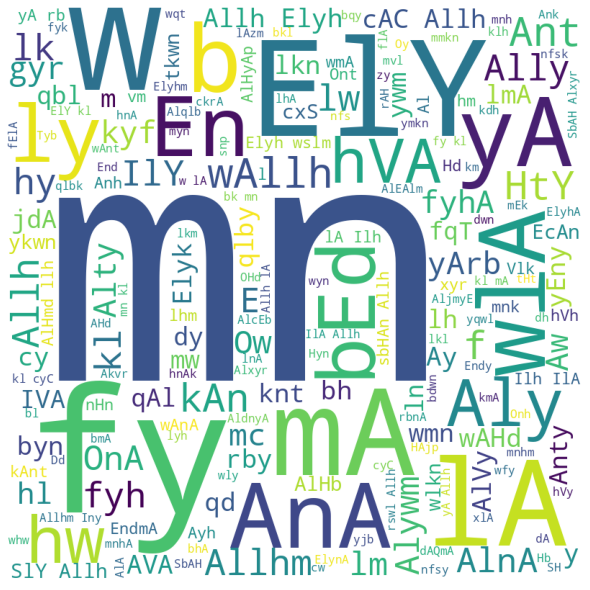

In [34]:
print("WordCloud of all words in all tweets")
wordcloudcreate(dmsa.dedec)

^These are all very common words: prepositions and connectives.

WordCloud of all words in DIALECT tweets


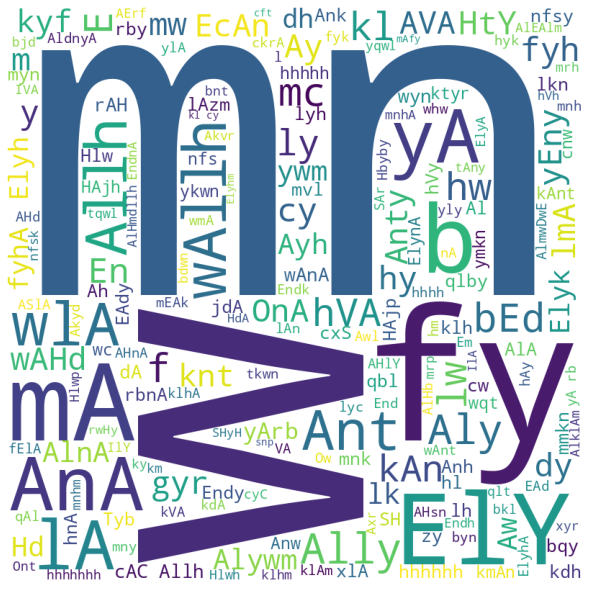

In [37]:
print("WordCloud of all words in DIALECT tweets")
wordcloudcreate(dmsa[dmsa['msa']==0]['dedec'])

^Much the same - there are lots of shared words between dialect and msa - they are the same language afterall!

WordCloud of all words in MSA tweets


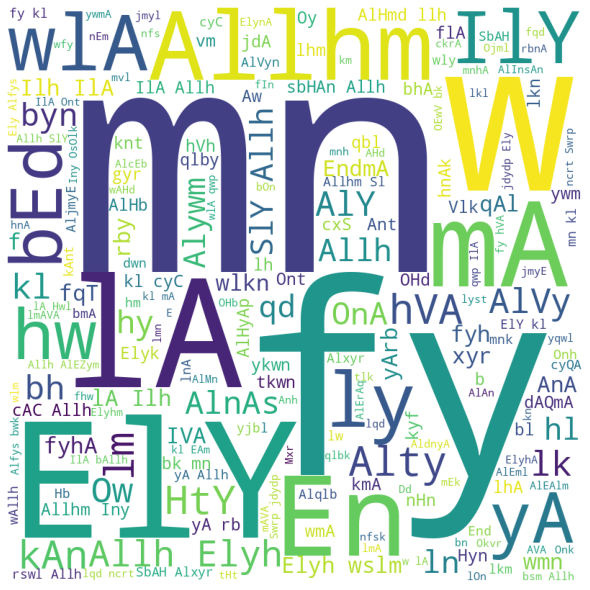

In [38]:
print("WordCloud of all words in MSA tweets")
wordcloudcreate(dmsa[dmsa['msa']==1]['dedec'])

#### CamelTools in-built classifier
Camel tools has its own dialect identifier - let's see how well it works

In [ ]:
from camel_tools.dialectid import DialectIdentifier

In [ ]:
builtin = DialectIdentifier.pretrained()

In [ ]:
dmsa['camel_predictions'] = dmsa['dedec'].apply(
    lambda x : camel_tools.dialectid.label_to_region(builtin.predict(x)[0]).top
)

In [ ]:
Their classifier predicts the region of dialect - we don't want this right now so I'll run an apply to change all non MSA to 0. 

In [31]:
predictions = dmsa['camel_predictions'].apply(lambda x : 1 if x == 'Modern Standard Arabic' else 0)

In [32]:
predictions

0        0
1        0
2        0
3        0
4        0
        ..
41995    0
41996    0
41997    0
41998    0
41999    0
Name: camel_predictions, Length: 42000, dtype: int64

In [33]:
from sklearn.metrics import accuracy_score, f1_score

In [34]:
accuracy_score(dmsa['msa'], predictions)

0.5001428571428571

In [35]:
f1_score(dmsa['msa'], predictions)

0.0006664127951256664

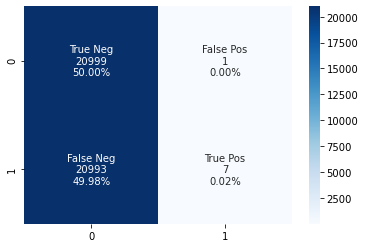

In [36]:
from sklearn.metrics import confusion_matrix

cf_matrix = confusion_matrix(dmsa['msa'], predictions)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues');

With the pretrained model it doesn't really ever predict MSA (I assume because it's primarily used to diffrentiate localised dialects) - let's see if we can train our own model.

#### Tokenisation
We will be using both Count vectorisation and Tfidf to tokenise our texts.
Here I perform a Train-Test Split - I shall use the provided test set later.

In [45]:
X_train, X_test, y_train, y_test = train_test_split(dmsa['dedec'], dmsa['msa'], test_size=0.2)

In [46]:
cvec = CountVectorizer(lowercase=False)

In [47]:
Xtok_train = cvec.fit_transform(X_train)
Xtok_test = cvec.transform(X_test)

#### Naive Bayes Models 

In [48]:
from sklearn.naive_bayes import BernoulliNB
NB = BernoulliNB()

In [49]:
NB.fit(X = Xtok_train, y = y_train)

BernoulliNB()

In [50]:
from sklearn.model_selection import cross_val_score
print('\033[1mBasic Tokenisation (CountVectoriser) with Naive Bayes\033[0m')
print('train', NB.score(Xtok_train, y_train))
print('test', NB.score(Xtok_test, y_test))
print('cv', cross_val_score(NB, Xtok_train, y_train).mean())

Basic Tokenisation (CountVectoriser) with Naive Bayes
train 0.8969940476190477
test 0.8433333333333334
cv 0.8324107142857142


In [51]:
#f1 score
print('cv', cross_val_score(NB, Xtok_train, y_train, scoring='f1').mean())

cv 0.8108523854567302


In [52]:
tf = TfidfVectorizer(lowercase=False)
Xtf_train = tf.fit_transform(X_train)
Xtf_test = tf.transform(X_test)

In [53]:
NB2 = BernoulliNB()
NB2.fit(X = Xtf_train, y = y_train)

BernoulliNB()

In [54]:
print('\033[1mBasic Tokenisation (Tfidf) with Naive Bayes\033[0m')
print('train', NB2.score(Xtf_train, y_train))
print('test', NB2.score(Xtf_test, y_test))
print('cv', cross_val_score(NB2, Xtf_train, y_train).mean())

Basic Tokenisation (Tfidf) with Naive Bayes
train 0.8969940476190477
test 0.8433333333333334
cv 0.8324107142857142


In [55]:
#f1 score
print('cv', cross_val_score(NB2, Xtf_train, y_train, scoring='f1').mean())

cv 0.8108523854567302


#### Exploring predictions

In [56]:
from sklearn.metrics import confusion_matrix

Conf Matrix Basic Tokenisation (CountVectoriser) with Naive Bayes


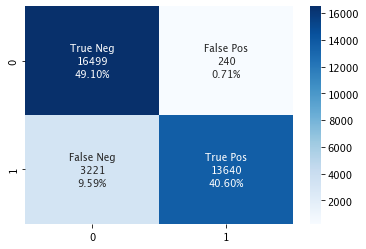

In [57]:
print('\033[1mConf Matrix Basic Tokenisation (CountVectoriser) with Naive Bayes\033[0m')
cf_matrix = confusion_matrix(y_train, NB.predict(Xtok_train))
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues');

Conf Matrix Basic Tokenisation (Tfidf) with Naive Bayes


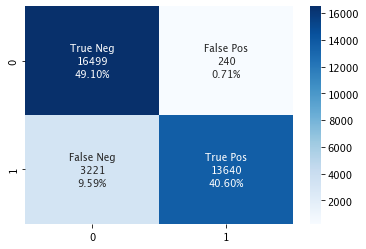

In [58]:
print('\033[1mConf Matrix Basic Tokenisation (Tfidf) with Naive Bayes\033[0m')
cf_matrix = confusion_matrix(y_train, NB2.predict(Xtf_train))
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues');

No difference between TFidf and cvec - maybe because it's a binary classification? Also 10 times more False Negatives than False Positives - in other words the model is wrongly predicting that things are dialect more often than it is wrongly predicting they are MSA

#### NB coefficient analysis

In [59]:
# collect the model coefficients in a dataframe
df_coef = pd.DataFrame(NB.coef_.T, index=cvec.get_feature_names(),
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
coefimportance = df_coef.sort_values('coefficients')

In [60]:
 coefimportance

,coefficients
AA,-9.732877
klccccc,-9.732877
klcy,-9.732877
klhAAAAAAAAAAAAAAAAAAAAAAA,-9.732877
klhh,-9.732877
...,...
ElY,-2.174882
lA,-1.978825
Allh,-1.806275
fy,-1.643088


In [61]:
#They're all negative - and we have lots of the same values - let's have a look
coefimportance[coefimportance['coefficients'] < -9.728597]

,coefficients
AA,-9.732877
klccccc,-9.732877
klcy,-9.732877
klhAAAAAAAAAAAAAAAAAAAAAAA,-9.732877
klhh,-9.732877
...,...
AdEylk,-9.732877
AHHsn,-9.732877
AHDrln,-9.732877
Abxyr,-9.732877


In [62]:
coefimportance[coefimportance['coefficients'] > -4.0]

,coefficients
yArb,-3.983484
Alywm,-3.977135
hVh,-3.970826
ywm,-3.933784
llh,-3.924735
cyC,-3.883552
lh,-3.869246
bEd,-3.866409
HtY,-3.843999
Ely,-3.784842


So when we have a look at the least and most important words in our model we discover some interesting things. The least important words for our model are super common words are the same in both dialect and msa - things like 'min' (from) 'al' (the) 'fy' (in). The most important are words that are very dialecty and would never appear in standard arabic - things like hhhhhhhhhhh (hahahahahaha), eayz (I want (egyptian)). So in terms of probabilities (which is how Naive Bayes works), certain words being present present a larger chance of being dialect and some do not. However thee Naive Bayes Classifier doesn't show us as much in terms of coefficient importance - Logistic Regression is way better for that: 

#### Logistic Regression Models

In [63]:
lr = LogisticRegression(max_iter=10000)
lr.fit(Xtok_train, y_train)

print('\033[1mBasic Tokenisation (CountVectoriser) with Logistic Regression\033[0m')
print('train', lr.score(Xtok_train, y_train))
print('test', lr.score(Xtok_test, y_test))
print('cv', cross_val_score(lr, Xtok_train, y_train).mean())

Basic Tokenisation (CountVectoriser) with Logistic Regression
train 0.981904761904762
test 0.8675
cv 0.8656845238095239


In [64]:
#F1
print('cv', cross_val_score(lr, Xtok_train, y_train, scoring='f1').mean())

cv 0.8660404018391554


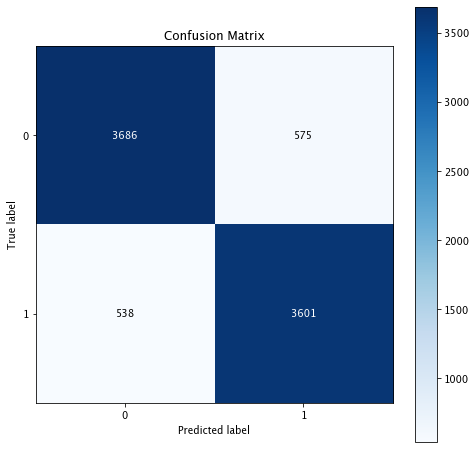

In [65]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, lr.predict(Xtok_test), figsize=(8,8))
plt.show()

In [66]:
lr2 = LogisticRegression(max_iter=10000)
lr2.fit(Xtf_train, y_train)

print('\033[1mBasic Tokenisation (Tf) with Logistic Regression\033[0m')
print('train', lr2.score(Xtf_train, y_train))
print('test', lr2.score(Xtf_test, y_test))
print('cv', cross_val_score(lr2, Xtf_train, y_train).mean())

Basic Tokenisation (Tf) with Logistic Regression
train 0.9374107142857143
test 0.8609523809523809
cv 0.8552380952380954


In [67]:
#f1
print('cv', cross_val_score(lr2, Xtf_train, y_train, scoring='f1').mean())

cv 0.8540471471020679


In [68]:
# collect the model coefficients in a dataframe
df_coef = pd.DataFrame(lr.coef_.T, index=cvec.get_feature_names(),
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
coefimportancelr = df_coef.sort_values('coefficients')

#### Logistic Regression coefficient analysis

In [69]:
coefimportancelr.head(30)

,coefficients
bs,-4.739376
Ally,-4.046725
mc,-3.656623
mw,-3.618109
rAH,-3.423549
EcAn,-3.290343
wyn,-3.074345
lAzm,-2.971499
dh,-2.843057
lyh,-2.764668


In [70]:
coefimportancelr.tail(30)

,coefficients
EZym,1.368538
AlSmt,1.384330
OmAm,1.390076
Vlk,1.400311
AlEZym,1.401319
mfAsd,1.402341
wlys,1.423457
AljmAl,1.448895
AlVy,1.462451
Ebr,1.465943


#### L1 regularised Logistic Regression 

L1 (Lasso) regularisation flattens out unnecessary ceofficients more than L2 
which is what the default model above is running - this will be useful to have a look at.

In [71]:
lrl1 = LogisticRegression(max_iter=10000, penalty='l1', solver='saga')
lrl1.fit(Xtok_train, y_train)

print('\033[1mBasic Tokenisation (CountVectoriser) with Logistic Regression l1\033[0m')
print('train', lrl1.score(Xtok_train, y_train))
print('test', lrl1.score(Xtok_test, y_test))
print('cv', cross_val_score(lrl1, Xtok_train, y_train).mean())

lr2l1 = LogisticRegression(max_iter=10000, penalty='l1', solver='saga')
lr2l1.fit(Xtf_train, y_train)

print('\033[1mBasic Tokenisation (Tf) with Logistic Regression l1\033[0m')
print('train', lr2l1.score(Xtf_train, y_train))
print('test', lr2l1.score(Xtf_test, y_test))
print('cv', cross_val_score(lr2l1, Xtf_train, y_train).mean())

Basic Tokenisation (CountVectoriser) with Logistic Regression l1
train 0.9064880952380953
test 0.8575
cv 0.8510714285714286
Basic Tokenisation (Tf) with Logistic Regression l1
train 0.862470238095238
test 0.8358333333333333
cv 0.830357142857143


In [72]:
df_coefl1 = pd.DataFrame(lrl1.coef_.T, index=cvec.get_feature_names(),
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
coefimportancelrl1 = df_coefl1.sort_values('coefficients')

In [73]:
# Let's look at all the non-zero coefficients
highcoef = coefimportancelrl1[(coefimportancelrl1['coefficients']>1) | (coefimportancelrl1['coefficients']<-1)].sort_values('coefficients')

In [74]:
highcoef

,coefficients
bs,-6.190925
mc,-4.696854
Ally,-4.654547
mw,-4.519279
EcAn,-4.181723
...,...
Alyh,2.084390
lmAVA,2.121461
dEAC,2.184020
ywmA,2.270291


#### Making Arabic Coefficient wordclouds

To better explore how our model is classifying its tweets I have created wordclouds based on the strength of each coefficient. 

MSA coefficients


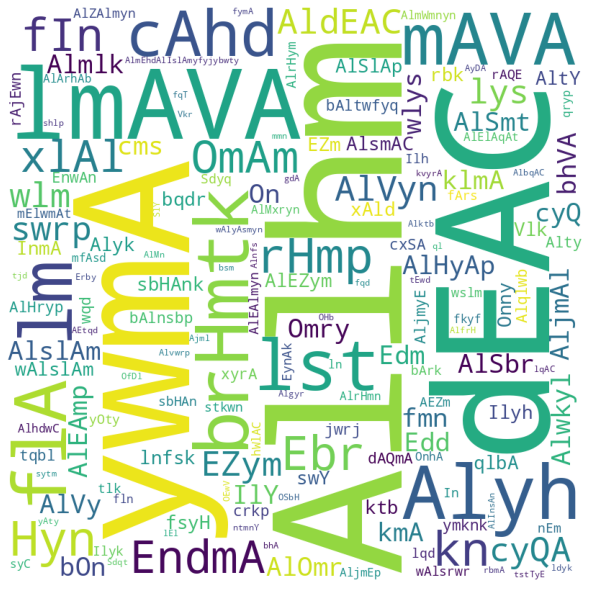

In [163]:
# Making a wordcloud based on coefficient strength for msa prediction - you do this by building a dictionary

diction = highcoef[highcoef['coefficients']>0].to_dict()

wc = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10)
wcshow = wc.generate_from_frequencies(diction['coefficients'])
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wcshow)
plt.axis("off")
plt.tight_layout(pad = 0)
print('MSA coefficients') 
plt.show()

In [141]:
msacoef = highcoef[highcoef['coefficients']>0]

In [142]:
msacoef['word']=msacoef.index

In [143]:
msacoef

,coefficients,word
mmn,1.003057,mmn
rbmA,1.008708,rbmA
AlbqAC,1.009549,AlbqAC
Ajml,1.011291,Ajml
Sdqt,1.012147,Sdqt
...,...,...
Alyh,2.084390,Alyh
lmAVA,2.121461,lmAVA
dEAC,2.184020,dEAC
ywmA,2.270291,ywmA


Now we need to reverse the transliteration

In [144]:
bw2ar = CharMapper.builtin_mapper('safebw2ar')

bw2ar_translit = Transliterator(bw2ar)

msacoef['word'] = msacoef['word'].apply(lambda x : bw2ar_translit.transliterate(x) )

In [145]:
msacoef

,coefficients,word
mmn,1.003057,ممن
rbmA,1.008708,ربما
AlbqAC,1.009549,البقاء
Ajml,1.011291,اجمل
Sdqt,1.012147,صدقت
...,...,...
Alyh,2.084390,اليه
lmAVA,2.121461,لماذا
dEAC,2.184020,دعاء
ywmA,2.270291,يوما


In [146]:
mascoef = msacoef.set_index('word', drop=True)

MSA coefficients (arabic)


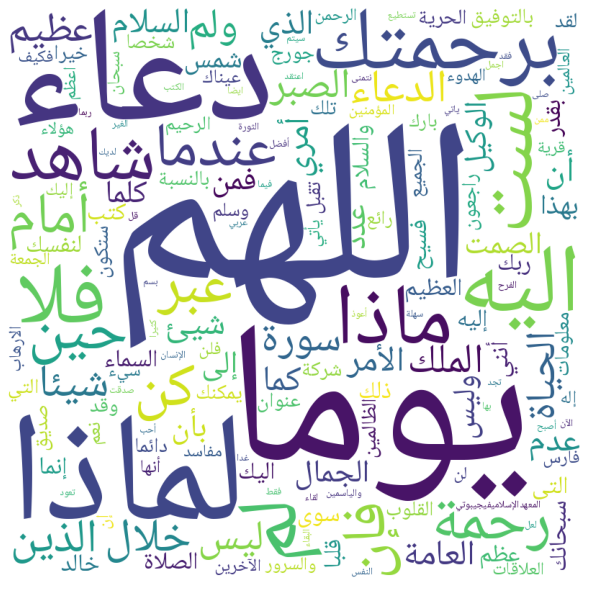

In [147]:
# Making a wordcloud based on coefficient strength for msa prediction


diction = mascoef.to_dict()
wc = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10, font_path='/Library/Fonts/NotoNaskhArabic-VariableFont_wght.ttf')
wcshow = wc.generate_from_frequencies(diction['coefficients'])
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wcshow)
plt.axis("off")
plt.tight_layout(pad = 0)
print('MSA coefficients (arabic)') 
plt.show()

MSA coefficients


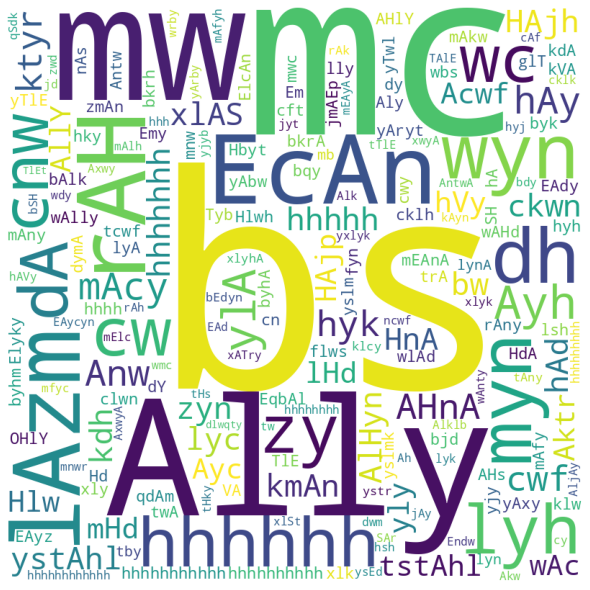

In [148]:
# Making a wordcloud based on coefficient strength for dialect prediction

dialcoefs = highcoef[highcoef['coefficients']<0]
dialcoefs['coefficients'] = abs(dialcoefs['coefficients'])
diction2 = dialcoefs.to_dict()
wc = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10)
wcshow = wc.generate_from_frequencies(diction2['coefficients'])
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wcshow)
plt.axis("off")
plt.tight_layout(pad = 0)
print('MSA coefficients') 
plt.show()

In [149]:
dcoef = highcoef[highcoef['coefficients']<0]

In [150]:
dcoef['coefficients'] = abs(dcoef['coefficients'])

In [151]:
dcoef['word']=dcoef.index

In [152]:
dcoef

,coefficients,word
bs,6.190925,bs
mc,4.696854,mc
Ally,4.654547,Ally
mw,4.519279,mw
EcAn,4.181723,EcAn
...,...,...
Alzyn,1.009370,Alzyn
nzl,1.006036,nzl
EsY,1.005243,EsY
mAEAd,1.001408,mAEAd


In [153]:
bw2ar = CharMapper.builtin_mapper('safebw2ar')

bw2ar_translit = Transliterator(bw2ar)

dcoef['word'] = dcoef['word'].apply(lambda x : bw2ar_translit.transliterate(x) )

In [154]:
dcoef

,coefficients,word
bs,6.190925,بس
mc,4.696854,مش
Ally,4.654547,اللي
mw,4.519279,مو
EcAn,4.181723,عشان
...,...,...
Alzyn,1.009370,الزين
nzl,1.006036,نزل
EsY,1.005243,عسى
mAEAd,1.001408,ماعاد


In [155]:
dcoef = dcoef.set_index('word', drop=True)

Dialect coefficients (arabic)


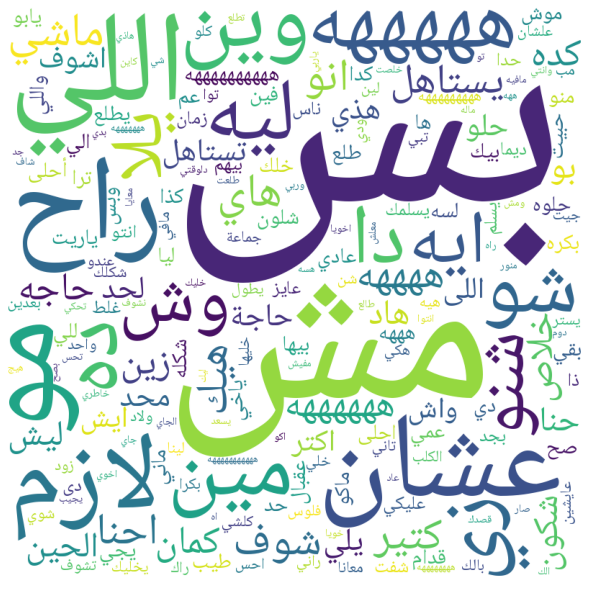

In [156]:
# Making a wordcloud based on coefficient strength for msa prediction
diction = dcoef.to_dict()
wc = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10, font_path='/Library/Fonts/NotoNaskhArabic-VariableFont_wght.ttf')
wcshow = wc.generate_from_frequencies(diction['coefficients'])
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wcshow)
plt.axis("off")
plt.tight_layout(pad = 0)
print('Dialect coefficients (arabic)') 
plt.show()

I have collated the above into a function:
(I use it in my dialect classifier below)

In [ ]:
#function which extracts the coefficients of words
def getcoefwords(coeflist):
    df_coef = pd.DataFrame(coeflist.T, index=cvec2.get_feature_names(),
                           columns=['coefficients'])
    return df_coef.sort_values('coefficients')

In [157]:
#function which makes a wordcloud
def arabicwordcloud(coefwords, positive=True):
    if positive==True:
        highcoefs = coefwords.sort_values('coefficients', ascending=False)[:150]
    elif positive==False:
        highcoefs = coefwords.sort_values('coefficients', ascending=True)[:150]
        highcoefs['coefficients'] = abs(highcoefs['coefficients'])
    highcoefs['word'] = highcoefs.index
    bw2ar = CharMapper.builtin_mapper('safebw2ar')
    bw2ar_translit = Transliterator(bw2ar)
    highcoefs['word'] = highcoefs['word'].apply(lambda x : bw2ar_translit.transliterate(x))
    highcoefs = highcoefs.set_index('word', drop=True)
    diction = highcoefs.to_dict()
    wc = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    min_font_size = 10, font_path='/Library/Fonts/NotoNaskhArabic-VariableFont_wght.ttf')
    wcshow = wc.generate_from_frequencies(diction['coefficients'])

    # plot the WordCloud image                      
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wcshow)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()

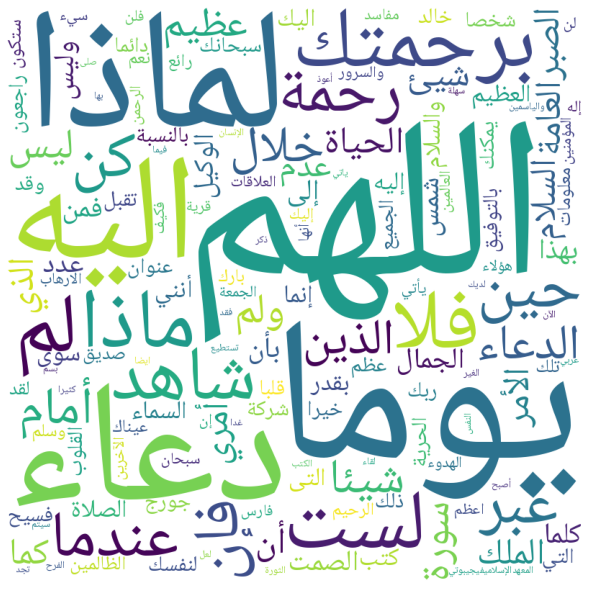

In [158]:
arabicwordcloud(highcoef, True)

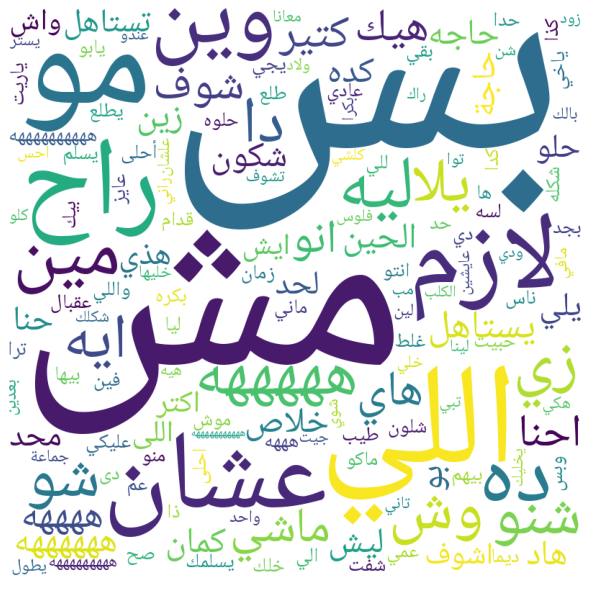

In [159]:
arabicwordcloud(highcoef, False)

So it is clear that to a considerable extent it is possible to classify a tweet according to its register in the Arabic language - however, although I'm getting good scores with this model the way that they were labelled by the data collators in the first place was via a model - so what I'm doing with this is just reverse engineering. So to get into the real deal let's refine our data to just dialect and see if we can classify different dialects. 

# Dialect Classifier

In [164]:
D_train.head(3)

,#1_tweetid,#2_tweet,#3_country_label,#4_province_label,MSA?
0,TRAIN_0,حاجة حلوة اكيد,Egypt,eg_Faiyum,0
1,TRAIN_1,عم بشتغلوا للشعب الاميركي اما نحن يكذبوا ويغشو...,Iraq,iq_Dihok,0
2,TRAIN_2,ابشر طال عمرك,Saudi_Arabia,sa_Ha'il,0


In [165]:
D_train['#3_country_label'].value_counts()

Egypt                   4283
Iraq                    2729
Saudi_Arabia            2140
Algeria                 1809
Oman                    1501
Syria                   1287
Libya                   1286
Tunisia                  859
Morocco                  858
Lebanon                  644
United_Arab_Emirates     642
Yemen                    429
Jordan                   429
Kuwait                   429
Palestine                428
Djibouti                 215
Qatar                    215
Bahrain                  215
Mauritania               215
Sudan                    215
Somalia                  172
Name: #3_country_label, dtype: int64

#### Relabelling
To start off with I want to train a model that will identify broader areas of dialectical similarity:
I have put together these groups of dialects. Dialects can be grouped in loads of ways but this is the way I've chosen to do it for the sake of our model.
<br/>
'Nile_Basin': 'Egypt', 'Sudan'
<br/>
'Iraq': 'Iraq'
<br/>
'Gulf': 'Saudi_Arabia', 'Oman', 'United_Arab_Emirates','Bahrain', 'Qatar','Kuwait'
<br/>
'Levantine': 'Syria','Jordan','Palestine', 'Lebanon'
<br/>
'Maghrebi': 'Algeria','Morocco','Tunisia', 'Libya', 'Mauritania'
<br/>
'Yemeni': 'Yemen', 'Djibouti', 'Somalia'

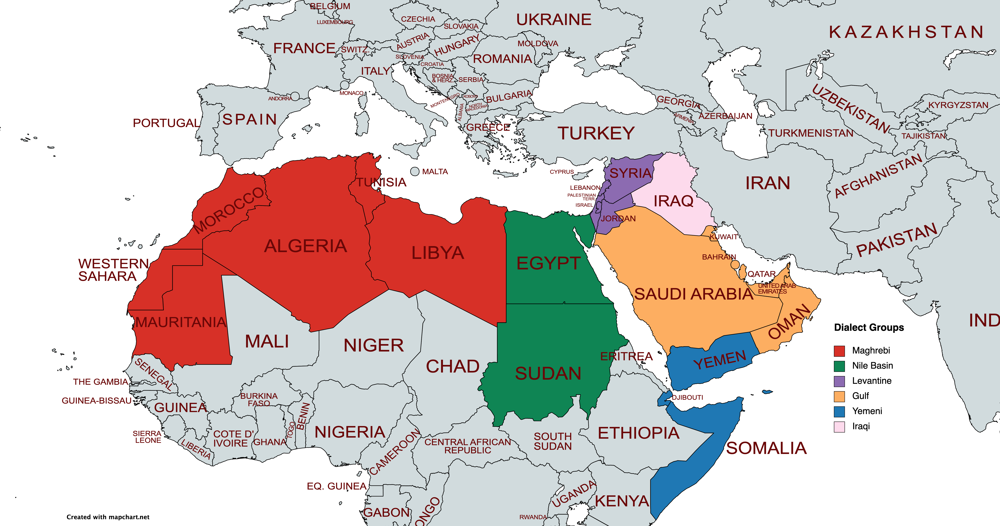

In [166]:
def region_replace(country):
    if country in ['Saudi_Arabia', 'Oman', 'United_Arab_Emirates','Bahrain', 'Qatar','Kuwait']:
        return 'Gulf'
    elif country in ['Egypt', 'Sudan']:
        return 'Nile_Basin'
    elif country in ['Iraq']:
        return 'Iraq'
    elif country in ['Syria','Jordan','Palestine', 'Lebanon']:
        return 'Levant'
    elif country in ['Algeria','Morocco','Tunisia', 'Libya', 'Mauritania']:
        return 'Maghreb'
    elif country in ['Yemen', 'Djibouti', 'Somalia']:
        return 'Yemen_Horn'
    else:
        return np.nan

#### We're going to import the supplied test dataset instead of doing a traintest split.

In [167]:
# Dataset comes with preset train test and dev sets
D_test = pd.read_csv('data/NADI2021_DEV.1.0/Subtask_1.2+2.2_DA/DA_dev_labeled.tsv', sep='\t')

In [168]:
D_train = D_train.drop(columns=['MSA?'])

In [169]:
D_train.columns = ['id', 'tweet', 'country', 'province']
D_test.columns = ['id', 'tweet', 'country', 'province']

In [170]:
D_train['group'] = D_train['country'].apply(region_replace)
D_test['group'] = D_test['country'].apply(region_replace)

In [171]:
X_train_g = D_train['tweet'] 
X_test_g = D_test['tweet'] 

y_train_g = D_train['group'] 
y_test_g = D_test['group'] 

#### Cleaning and preparing the Arabic

In [173]:
X_train_g = X_train_g.apply(tweettoclean)
X_test_g = X_test_g.apply(tweettoclean)

In [174]:
# Vectorise
X_train_gc = cvec.fit_transform(X_train_g)
X_test_gc = cvec.transform(X_test_g)

In [175]:
# Export
X_train_g.to_csv('cleanedtweets_train.csv')
X_test_g.to_csv('cleanedtweets_test.csv')

In [176]:
y_train_g.value_counts(normalize=True)

Gulf          0.244857
Maghreb       0.239381
Nile_Basin    0.214190
Levant        0.132762
Iraq          0.129952
Yemen_Horn    0.038857
Name: group, dtype: float64

Baseline of 0.244 - Also pretty different sizes of categories - how can we sort this? - I'll look into it later.

#### Naive Bayes Models 

In [177]:
from sklearn.naive_bayes import MultinomialNB

NBg = MultinomialNB()
NBg.fit(X = X_train_gc, y = y_train_g)

from sklearn.model_selection import cross_val_score
print('\033[1mBasic Tokenisation (CountVectoriser) with Naive Bayes\033[0m')
print('train', NBg.score(X_train_gc, y_train_g))
print('test', NBg.score(X_test_gc, y_test_g))
print('cv', cross_val_score(NBg, X_train_gc, y_train_g, cv=5).mean())

Basic Tokenisation (CountVectoriser) with Naive Bayes
train 0.8375238095238096
test 0.539
cv 0.5624761904761905


In [178]:
X_train_gt = tf.fit_transform(X_train_g)
X_test_gt = tf.transform(X_test_g)

In [179]:
from sklearn.naive_bayes import MultinomialNB

NBgt = MultinomialNB()
NBgt.fit(X = X_train_gt, y = y_train_g)

from sklearn.model_selection import cross_val_score
print('\033[1mBasic Tokenisation (Tfidf) with Naive Bayes\033[0m')
print('train', NBg.score(X_train_gt, y_train_g))
print('test', NBg.score(X_test_gt, y_test_g))
print('cv', cross_val_score(NBg, X_train_gt, y_train_g, cv=5).mean())

Basic Tokenisation (Tfidf) with Naive Bayes
train 0.846
test 0.5332
cv 0.5170000000000001


#### n-gram comparisons
What is the ideal n-gram order for this model?

In [189]:
from sklearn.naive_bayes import MultinomialNB

def ngramtester(Xtrain, Xtest, ytrain, ytest, n):
    testercvec = CountVectorizer(ngram_range=(1,n), lowercase=False)
    tester_X_train = testercvec.fit_transform(Xtrain)
    tester_X_test = testercvec.transform(Xtest)
    
    NB = MultinomialNB()
    NB.fit(X =tester_X_train, y = ytrain)

    print(f'\033[1mBasic Tokenisation (CountVectoriser), ngrams = {n}, with Naive Bayes\033[0m')
    print('train', NB.score(tester_X_train, ytrain))
    print('test', NB.score(tester_X_test, ytest))
    print('cv', cross_val_score(NB, tester_X_train, ytrain, cv=5).mean())
    
    testertf = TfidfVectorizer(ngram_range=(1,n), lowercase=False)
    tester_X_train = testertf.fit_transform(Xtrain)
    tester_X_test = testertf.transform(Xtest)
    
    NB = MultinomialNB()
    NB.fit(X =tester_X_train, y = ytrain)

    print(f'\033[1mBasic Tokenisation (tfidf), ngrams = {n}, with Naive Bayes\033[0m')
    print('train', NB.score(tester_X_train, ytrain))
    print('test', NB.score(tester_X_test, ytest))
    print('cv', cross_val_score(NB, tester_X_train, ytrain, cv=5).mean())

In [193]:
for num in range(1,):
    ngramtester(X_train_g, X_test_g, y_train_g, y_test_g, num)

Basic Tokenisation (CountVectoriser), ngrams = 1, with Naive Bayes
train 0.8375238095238096
test 0.539
cv 0.5624761904761905
Basic Tokenisation (tfidf), ngrams = 1, with Naive Bayes
train 0.7515238095238095
test 0.5138
cv 0.5170000000000001
Basic Tokenisation (CountVectoriser), ngrams = 2, with Naive Bayes
train 0.9522380952380952
test 0.5386
cv 0.5640952380952381
Basic Tokenisation (tfidf), ngrams = 2, with Naive Bayes
train 0.8363809523809523
test 0.5048
cv 0.49990476190476185
Basic Tokenisation (CountVectoriser), ngrams = 3, with Naive Bayes
train 0.9801428571428571
test 0.5362
cv 0.5615238095238094
Basic Tokenisation (tfidf), ngrams = 3, with Naive Bayes
train 0.8772857142857143
test 0.5016
cv 0.4944285714285715
Basic Tokenisation (CountVectoriser), ngrams = 4, with Naive Bayes
train 0.9842380952380952
test 0.5352
cv 0.5554285714285715
Basic Tokenisation (tfidf), ngrams = 4, with Naive Bayes
train 0.895952380952381
test 0.499
cv 0.48966666666666675
Basic Tokenisation (CountVectoris

n-grams of one and two are very similar with two beating one by a very small margin

#### Classification reports, Confusion Matrices, Curves

In [195]:
cvec2 = CountVectorizer(ngram_range=(1,2), lowercase=False)
X_train_g2 = cvec2.fit_transform(X_train_g)
X_test_g2 = cvec2.transform(X_test_g)

In [196]:
NBg2 = MultinomialNB()
NBg2.fit(X = X_train_g2, y = y_train_g)

MultinomialNB()

Basic Tokenisation (CountVectoriser), ngrams = 2, with Naive Bayes


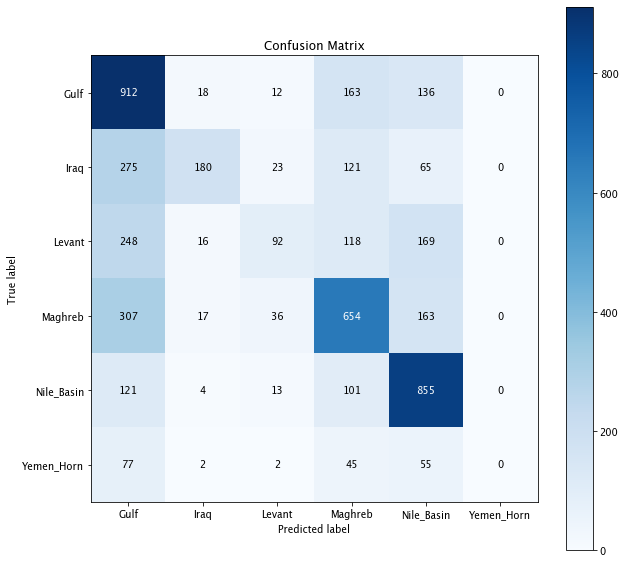

In [197]:
import scikitplot as skplt
print('\033[1mBasic Tokenisation (CountVectoriser), ngrams = 2, with Naive Bayes\033[0m')

skplt.metrics.plot_confusion_matrix(y_test_g, NBg2.predict(X_test_g2), figsize=(10,10))
plt.show()

In [198]:
y_train_g.value_counts()

Gulf          5142
Maghreb       5027
Nile_Basin    4498
Levant        2788
Iraq          2729
Yemen_Horn     816
Name: group, dtype: int64

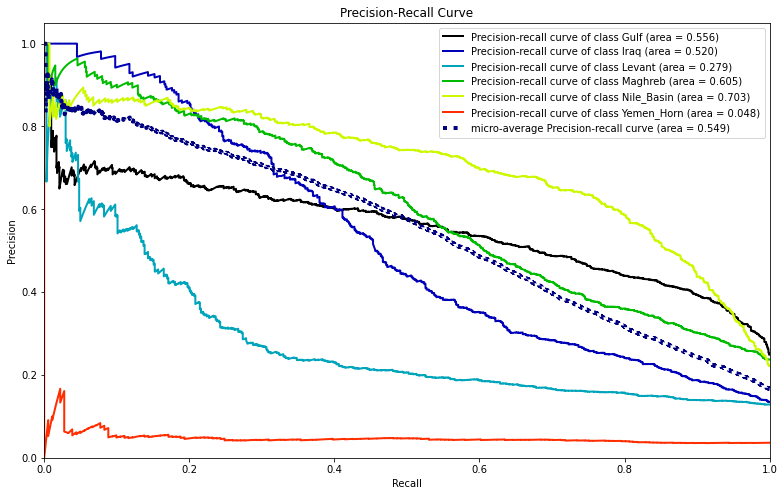

In [75]:
skplt.metrics.plot_precision_recall(y_test_g, NBg2.predict_proba(X_test_g2), figsize = (13,8))
plt.show()

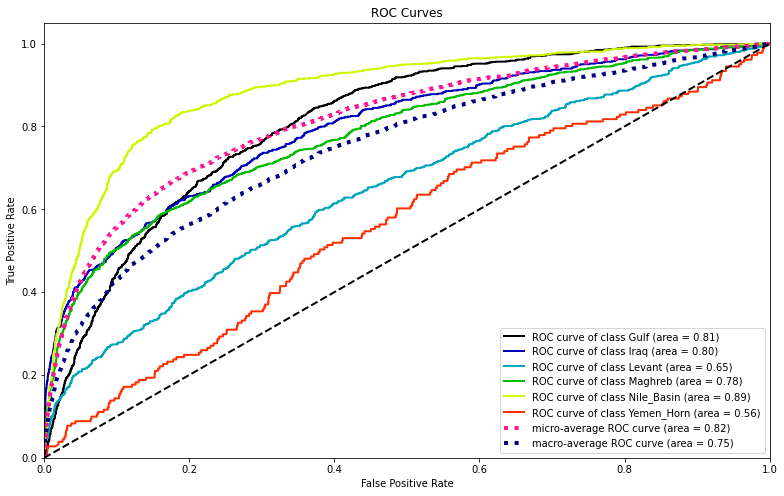

In [76]:
skplt.metrics.plot_roc(y_test_g, NBg2.predict_proba(X_test_g2), figsize = (13,8))
plt.show()

In [110]:
from sklearn.metrics import classification_report
print(classification_report(y_test_g, NBg2.predict(X_test_g2)))

              precision    recall  f1-score   support

        Gulf       0.47      0.73      0.57      1241
        Iraq       0.76      0.27      0.40       664
      Levant       0.52      0.15      0.23       643
     Maghreb       0.54      0.55      0.55      1177
  Nile_Basin       0.59      0.78      0.67      1094
  Yemen_Horn       0.00      0.00      0.00       181

    accuracy                           0.54      5000
   macro avg       0.48      0.41      0.40      5000
weighted avg       0.54      0.54      0.50      5000



/Users/eesanoble/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/eesanoble/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/eesanoble/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Almost inevitably because of my significant class imbalance my model was doing well to predict the majority classes but failing to do so with the minority classes. 

#### Logistic Regression Models

In [184]:
# Let's write a function that turns the arabic tweets into our transliterated normalized tweets
def tweettoclean(string):
    return nopunc(dediac_safebw(ar2bw_translit.transliterate(normalize.normalize_unicode(nolatin(string)))))

In [130]:
cvec1 = CountVectorizer(ngram_range=(1,1), lowercase=False)
X_train_g1 = cvec1.fit_transform(X_train_g)
X_test_g1 = cvec1.transform(X_test_g)

LRg1 = LogisticRegression()
LRg1.fit(X = X_train_g1, y = y_train_g)

from sklearn.model_selection import cross_val_score
print('\033[1mBasic Tokenisation (CountVectoriser), ngrams = 1, with Logistic Regression\033[0m')
print('train', LRg1.score(X_train_g1, y_train_g))
print('test', LRg1.score(X_test_g1, y_test_g))
print('cv', cross_val_score(LRg1, X_train_g1, y_train_g, cv=5).mean())

Basic Tokenisation (CountVectoriser), ngrams = 1, with Logistic Regression
train 0.9538095238095238
test 0.5086
cv 0.5312857142857144


In [139]:
LRg2 = LogisticRegression()
LRg2.fit(X = X_train_g2, y = y_train_g)

from sklearn.model_selection import cross_val_score
print('\033[1mBasic Tokenisation (CountVectoriser), ngrams = 2, with Logistic Regression\033[0m')
print('train', LRg2.score(X_train_g2, y_train_g))
print('test', LRg2.score(X_test_g2, y_test_g))
print('cv', cross_val_score(LRg2, X_train_g2, y_train_g, cv=5).mean())

Basic Tokenisation (CountVectoriser), ngrams = 2, with Logistic Regression
train 0.9976190476190476
test 0.5156
cv 0.5361428571428573


#### Coefficient Analysis and WordClouds

In [168]:
LRg2.classes_

array(['Gulf', 'Iraq', 'Levant', 'Maghreb', 'Nile_Basin', 'Yemen_Horn'],
      dtype=object)

In [116]:
#Let's extract the coefficients!
Gulf_coef = LRg2.coef_[0]
Iraqi_coef = LRg2.coef_[1]
Levantine_coef = LRg2.coef_[2]
Maghrebi_coef = LRg2.coef_[3]
Nilebasin_coef = LRg2.coef_[4]
Yemeni_coef = LRg2.coef_[5]

In [165]:
LRg2.coef_

array([[ 0.12886808, -0.07341009,  0.20227817, ..., -0.02698129,
        -0.02995255, -0.02995255],
       [-0.08622567, -0.05353904, -0.03268663, ..., -0.0142863 ,
        -0.02132253, -0.02132253],
       [-0.09787828, -0.05264163, -0.04523665, ..., -0.01600042,
        -0.03224403, -0.03224403],
       [ 0.20028271,  0.23988806, -0.03960535, ...,  0.07590413,
         0.10570859,  0.10570859],
       [-0.11505658, -0.04602944, -0.06902714, ..., -0.01464991,
        -0.01126558, -0.01126558],
       [-0.02999026, -0.01426787, -0.01572239, ..., -0.00398621,
        -0.0109239 , -0.0109239 ]])

Gulf_coef Positive


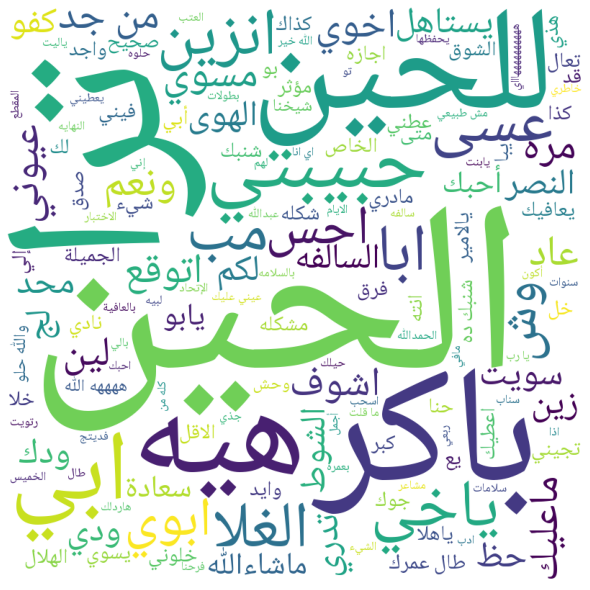

Gulf_coef Negative


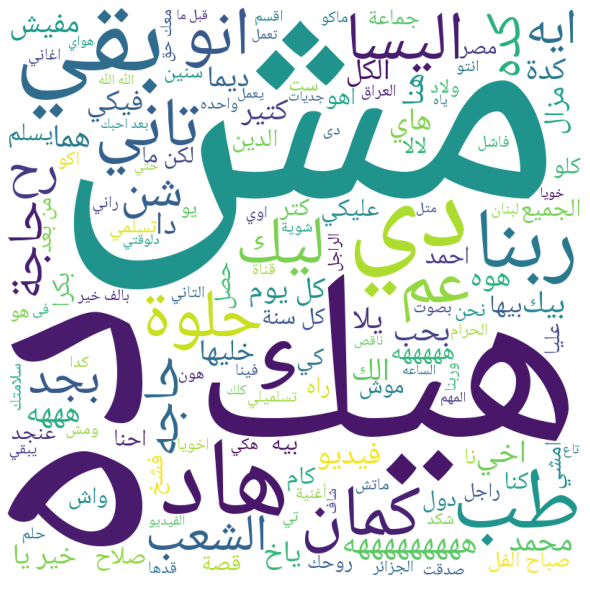

Iraqi_coef Positive


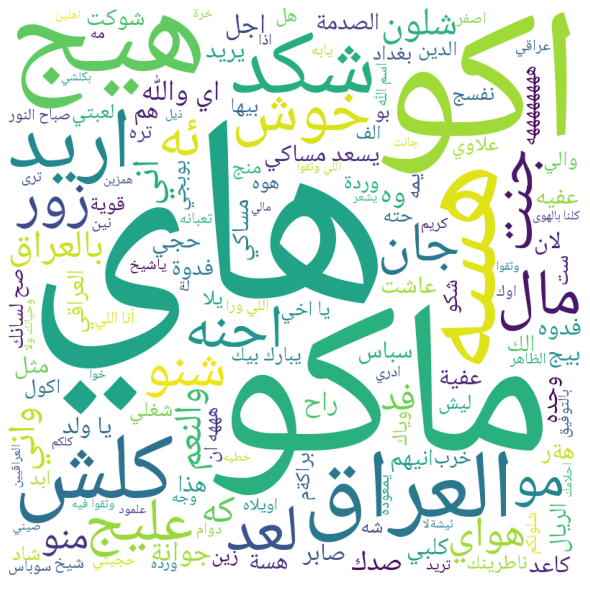

Iraqi_coef Negative


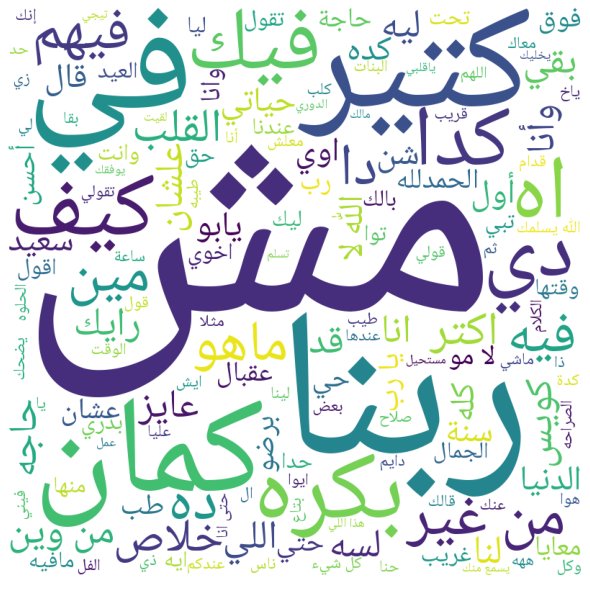

Levantine_coef Positive


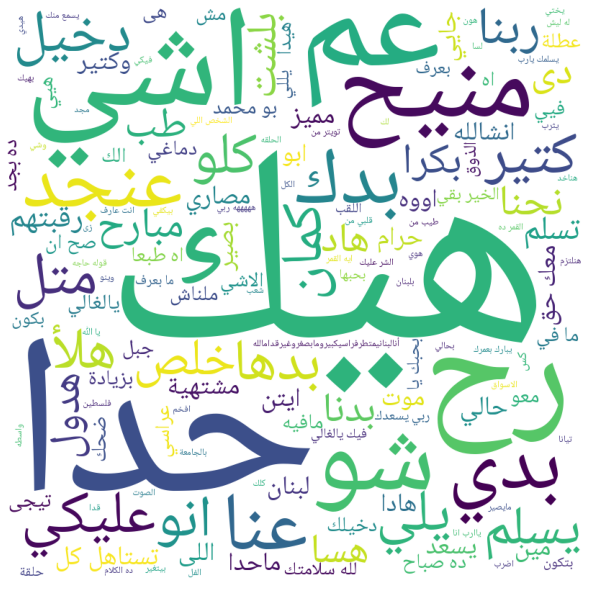

Levantine_coef Negative


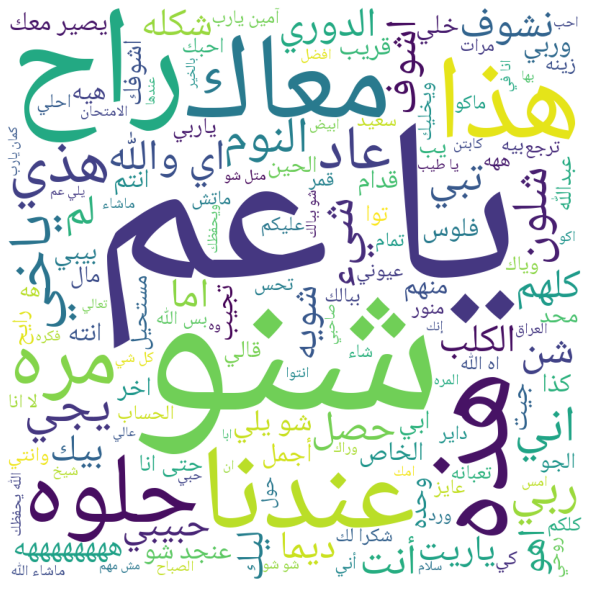

Maghrebi_coef Positive


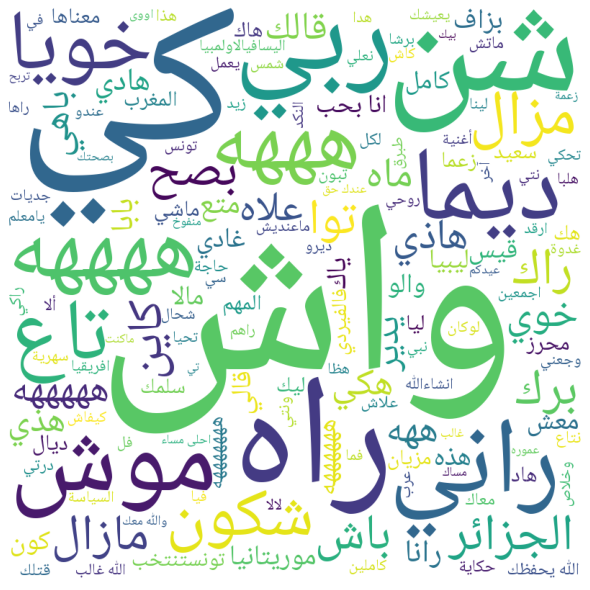

Maghrebi_coef Negative


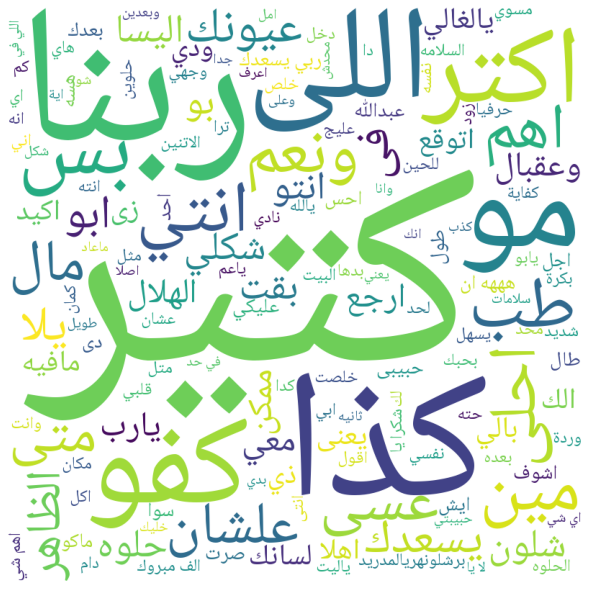

Nilebasin_coef Positive


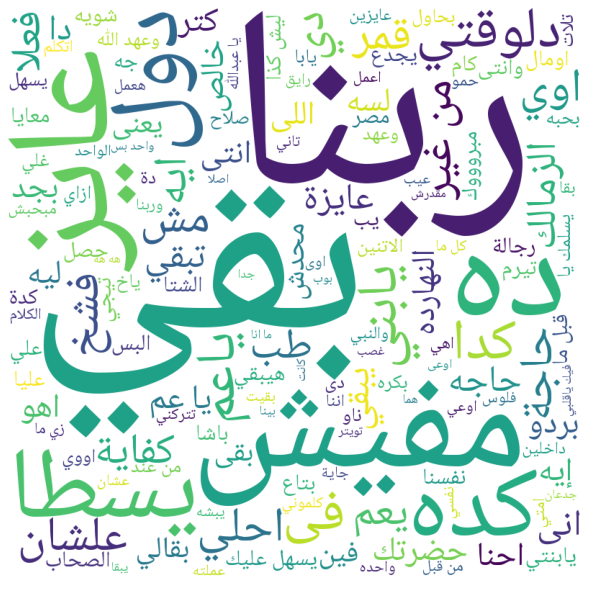

Nilebasin_coef Negative


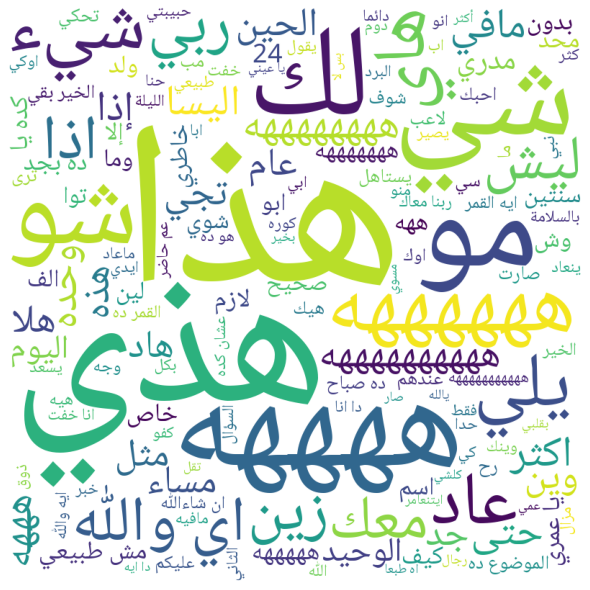

Yemeni_coef Positive


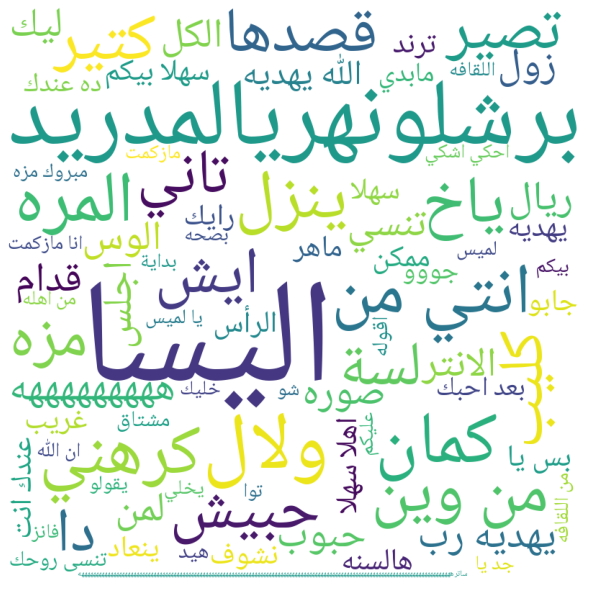

Yemeni_coef Negative


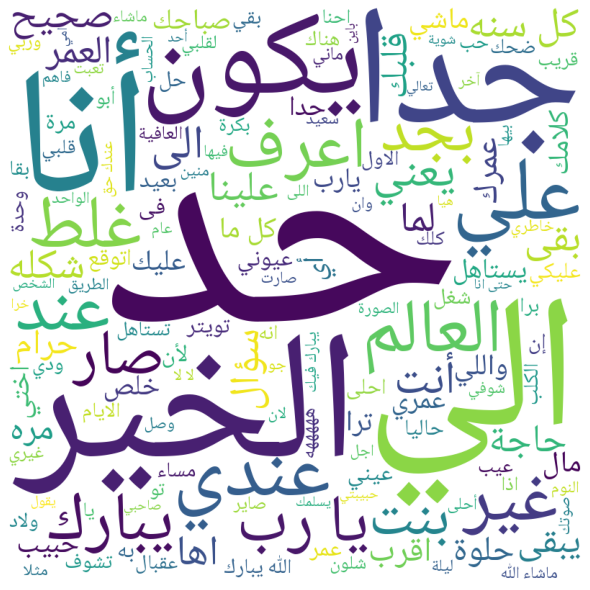

In [164]:
coeflists = [Gulf_coef,
            Iraqi_coef,
            Levantine_coef,
            Maghrebi_coef,
            Nilebasin_coef,
            Yemeni_coef]
coefnames = ['Gulf_coef',
            'Iraqi_coef',
            'Levantine_coef',
           'Maghrebi_coef',
           'Nilebasin_coef',
            'Yemeni_coef']
for coeflist, coefname in zip(coeflists, coefnames):
    print(coefname+' Positive')
    arabicwordcloud(getcoefwords(coeflist))
    print(coefname+' Negative')
    arabicwordcloud(getcoefwords(coeflist), positive=False)

In an attempt to improve my model - I will incorporate Morphological Tokenisation which should overcome orthographical ambiguities in Arabic. I will also incorporate RandomOversampling to attempt to rebalance my class imbalance.

#### Morphological Tokenisation

In [205]:
#morphological tokenisation
from camel_tools.disambig.mle import MLEDisambiguator
from camel_tools.tokenizers.morphological import MorphologicalTokenizer
from camel_tools.tokenizers.word import simple_word_tokenize

# Initialize disambiguators
mle = MLEDisambiguator.pretrained()

# We expect a sentence to be whitespace/punctuation tokenized beforehand.
# We provide a simple whitespace and punctuation tokenizer as part of camel_tools.
# See camel_tools.tokenizers.word.simple_word_tokenize.

bw2ar = CharMapper.builtin_mapper('safebw2ar')
bw2ar_translit = Transliterator(bw2ar)

sentence = 'chryn wtrwH wAlbAqy gyr Syf mlynA'
sentencear = bw2ar_translit.transliterate(sentence)
sentencearstok = simple_word_tokenize(sentencear)

print(sentence)
print(sentencear)
print(sentencearstok)
# Create different morphological tokenizer instances

for scheme in ['atbseg',
               'atbtok',
               'bwtok',
               'd1seg',
               'd1tok',
               'd2seg',
               'd2tok',
               'd3seg',
               'd3tok']:

    msa_bw_tokenizer = MorphologicalTokenizer(disambiguator=mle, scheme=scheme)

# Generate tokenizations

    msa_bw_tok = msa_bw_tokenizer.tokenize(sentencearstok)


# Print results
    print(scheme,'tokenization:', msa_bw_tok)

chryn wtrwH wAlbAqy gyr Syf mlynA
شهرين وتروح والباقي غير صيف ملينا
['شهرين', 'وتروح', 'والباقي', 'غير', 'صيف', 'ملينا']
atbseg tokenization: ['شهرين', 'و+_تروح', 'و+_الباقي', 'غير', 'صيف', 'ملي_+نا']
atbtok tokenization: ['شهرين', 'و+_تروح', 'و+_الباقي', 'غير', 'صيف', 'ملي_+نا']
bwtok tokenization: ['شهر_+ين', 'و+_ت+_روح', 'و+_ال+_باقي', 'غير', 'صيف', 'ملي_+نا']
d1seg tokenization: ['شهرين', 'و+_تروح', 'و+_الباقي', 'غير', 'صيف', 'ملينا']
d1tok tokenization: ['شهرين', 'و+_تروح', 'و+_الباقي', 'غير', 'صيف', 'ملينا']
d2seg tokenization: ['شهرين', 'و+_تروح', 'و+_الباقي', 'غير', 'صيف', 'ملينا']
d2tok tokenization: ['شهرين', 'و+_تروح', 'و+_الباقي', 'غير', 'صيف', 'ملينا']
d3seg tokenization: ['شهرين', 'و+_تروح', 'و+_ال+_باقي', 'غير', 'صيف', 'ملي_+نا']
d3tok tokenization: ['شهرين', 'و+_تروح', 'و+_ال+_باقي', 'غير', 'صيف', 'ملي_+نا']


I like bwtok the most

In [207]:
# Let's sort a function to morphologically tokenise.  

def morphtoken(string):
    mle = MLEDisambiguator.pretrained()
    bw2ar = CharMapper.builtin_mapper('safebw2ar')
    bw2ar_translit = Transliterator(bw2ar)
    sentencear = bw2ar_translit.transliterate(string)
    sentencearstok = simple_word_tokenize(sentencear)
    msa_bw_tokenizer = MorphologicalTokenizer(disambiguator=mle, scheme='bwtok')
    msa_bw_tok = msa_bw_tokenizer.tokenize(sentencearstok)
    return msa_bw_tok

In order to reduce overfitting and reduce the computational load of my model I want to reduce the dimensionality of my model - After playing around with PCA and Truncated SVD for a while I found it was more effective and easier to raise the threshold of which words were included in the tokenisation to words/ words paris that appeared at least twice.

In [ ]:
# In order to use the count and tfidf vectorisers with morphological tokens you need to trick it using a dummy function
def dummy_fun(doc):
    return doc

cvec1 = CountVectorizer(ngram_range=(1,1),
                     min_df=2,
                     analyzer='word',
                     tokenizer=dummy_fun,
                     preprocessor=dummy_fun,
                     token_pattern=None)

cvec_trainmorph1 = cvec1.fit_transform(X_train_g.apply(morphtoken))
cvec_testmorph1 = cvec1.transform(X_test_g.apply(morphtoken))

cvec2 = CountVectorizer(ngram_range=(1,2),
                     min_df=2,
                     analyzer='word',
                     tokenizer=dummy_fun,
                     preprocessor=dummy_fun,
                     token_pattern=None)

cvec_trainmorph2 = cvec2.fit_transform(X_train_g.apply(morphtoken))
cvec_testmorph2 = cvec2.transform(X_test_g.apply(morphtoken))

In [ ]:
NB1 = MultinomialNB()
NB1.fit(X = cvec_trainmorph1, y = y_train_g)

print('\033[1m Reduced Morphological Tokenisation (CountVectoriser) with Naive Bayes n-grams = 1 \033[0m')
print('train', NB1.score(cvec_trainmorph1, y_train_g))
print('test', NB1.score(cvec_testmorph1, y_test_g))
print('cv', cross_val_score(NB1, cvec_trainmorph1, y_train_g, cv=5).mean())

In [ ]:
NB2 = MultinomialNB()
NB2.fit(X = cvec_trainmorph2, y = y_train_g)

print('\033[1m Reduced Morphological Tokenisation (CountVectoriser) with Naive Bayes n-grams = 2 \033[0m')
print('train', NB2.score(cvec_trainmorph2, y_train_g))
print('test', NB2.score(cvec_testmorph2, y_test_g))
print('cv', cross_val_score(NBno, cvec_trainmorph2, y_train_g, cv=5).mean())

Count Vectorisation with ngrams of 2, minimum word/phrase frequency of two, and morphological tokenisation is our best model so far.

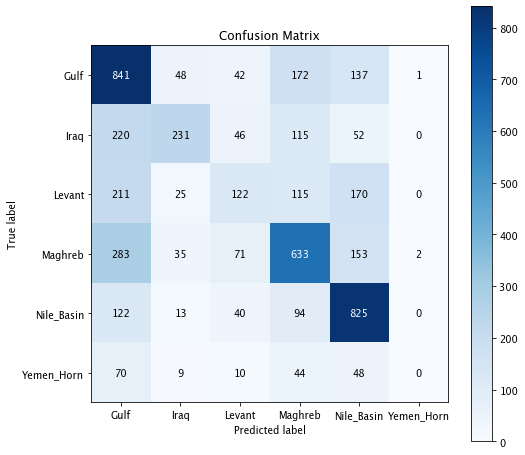

In [160]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test_g, NB2.predict(cvec_testmorph2), figsize=(8,8))
plt.show()

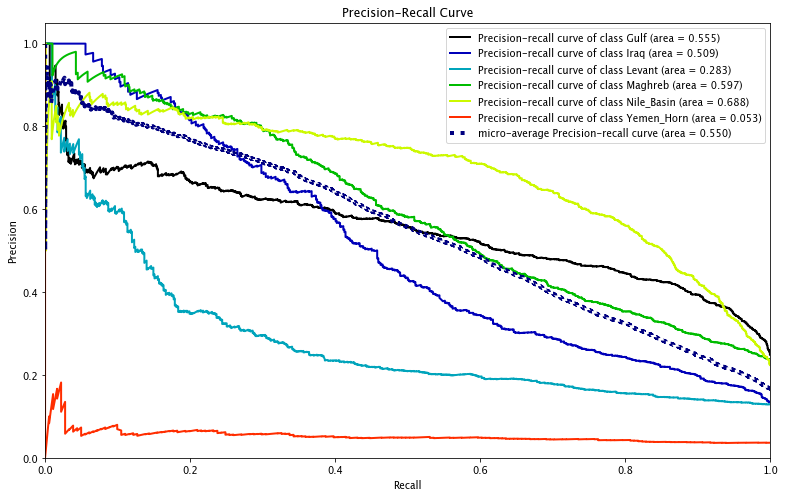

In [161]:
skplt.metrics.plot_precision_recall(y_test_g, NB2.predict_proba(cvec_testmorph2), figsize = (13,8))
plt.show()

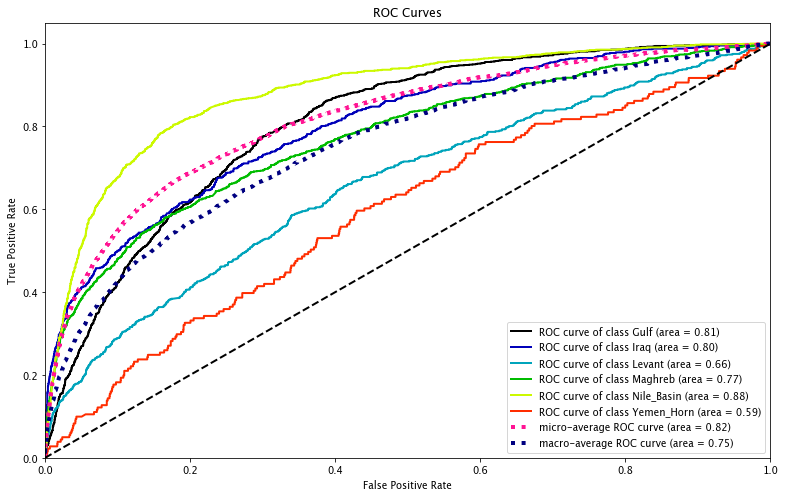

In [162]:
skplt.metrics.plot_roc(y_test_g, NB2.predict_proba(cvec_testmorph2), figsize = (13,8))
plt.show()

#### Oversampling

As is evident from the above visualisations our model is suffering due to an unwillingness to predict the minority classes - this will be because it has not seen enough of the Yemeni dialect to know when to predict it - this is further evident if we take a look at the coefficient strengths in the logistic regression model where the negative coefficients are far higher than the positive ones for Yemen. To attempt to rectify this I experimented with Overampling.

Oversampling randomly duplicates data points to provide you with the class balance you require. This means that if you use cross validation as your test of efficacy there will inevitably be data leakage between the folds due to the oversampling. In order to ensure this is not reflected in our tests of accuracy I created a pipeline which ensures that each fold itself is oversampled. I also used the test score here to ascertain accuracy. I used GridSearch and RandomisedSearch if GS was taking too long.

In [ ]:
#LogisticRegression GridSearch With Different Oversampling weights
kf = KFold(n_splits=3)
ros_pipeline = imbPipeline([('oversampler', RandomOverSampler(random_state=23)),
                            ('model', LogisticRegression(penalty='elasticnet', solver='saga', max_iter=1000))])

params = {
    'model__l1_ratio': [0,0.5,1],
    'model__C': np.logspace(-1,4,3),
    'oversampler__sampling_strategy': [{'Gulf':5142, 'Maghreb':5027, 'Nile_Basin': 4498, 'Levant': 3500,
                                        'Iraq': 3500, 'Yemen_Horn': 2000},
                                      'auto']
}

lrgrid_imba = GridSearchCV(ros_pipeline, param_grid=params, cv=kf, scoring='accuracy',
                        return_train_score=True, verbose=3, n_jobs=5)
lrgrid_imba.fit(cvec_trainmorph2, y_train);

In [ ]:
# Now NB with resampling
kf = KFold(n_splits=3)
ros_pipeline = imbPipeline([('oversampler', RandomOverSampler(random_state=23)),
                            ('model', MultinomialNB())])

params = {'oversampler__sampling_strategy': [{'Gulf':5142, 'Maghreb':5027, 'Nile_Basin': 4498, 'Levant': 3500,
                                        'Iraq': 3500, 'Yemen_Horn': 2000}]
}

grid_imbanb = RandomizedSearchCV(ros_pipeline, param_distributions=params, cv=kf, scoring='accuracy',
                        return_train_score=True, verbose=3, n_jobs=5)
grid_imbanb.fit(cvec_trainmorph2, y_train);

In [ ]:
#RandomForest GridSearch With Different Oversampling weights
kf = KFold(n_splits=3)
ros_pipeline2 = imbPipeline([('oversampler', RandomOverSampler(random_state=23)),
                            ('model', RandomForestClassifier())])

params2 = {'model__bootstrap': [True, False],
          'model__max_depth': [10, 50, 90, 130],
          'model__max_features': ['auto', 'sqrt'],
          'model__min_samples_split': [2, 5, 10],
          'oversampler__sampling_strategy': [{'Gulf':5142, 'Maghreb':5027, 'Nile_Basin': 4498, 'Levant': 3500,
                                        'Iraq': 3500, 'Yemen_Horn': 2000},
                                      {'Gulf':5000, 'Maghreb':5000, 'Nile_Basin': 5000, 'Levant': 4000,
                                        'Iraq': 4000, 'Yemen_Horn': 3000},
                                      'auto']
}

grid_imbarf = GridSearchCV(ros_pipeline2, param_grid=params2, cv=kf, scoring='accuracy',
                        return_train_score=True, verbose=3, n_jobs=5)
grid_imbarf.fit(cvec_trainmorph2, y_train);

In [ ]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test_g, grid_imbanb.predict(cvec_testmorph2), figsize=(8,8))
plt.show()

I also used the XGBoost Classifier on its own and in combination with oversampling 

In [ ]:
xg = XGBClassifier()
xg.fit(cvec_trainmorph2, y_train)

In [ ]:
# First XGB without resampling
params = {'max_ntree': range(1,300),
          'max_depth': range(10,1000),
}

random_grid_x = RandomizedSearchCV(XGBClassifier(), param_distributions=params, cv=kf, scoring='accuracy',
                        return_train_score=True, verbose=3, n_jobs=5)
random_grid_x.fit(cvec_trainmorph2, y_train);

In [ ]:
# Now with Oversampling
kf = KFold(n_splits=3)
ros_pipeline = imbPipeline([('oversampler', RandomOverSampler(random_state=23)),
                            ('model', XGBClassifier())])

params = {'model__max_ntree': range(1,300),
          'model__max_depth': range(10,1000),
          'oversampler__sampling_strategy': [{'Gulf':5142, 'Maghreb':5027, 'Nile_Basin': 4498, 'Levant': 3500,
                                        'Iraq': 3500, 'Yemen_Horn': 2000}]
}

random_grid_imba_x = RandomizedSearchCV(ros_pipeline, param_distributions=params, cv=kf, scoring='accuracy',
                        return_train_score=True, verbose=3, n_jobs=5)
random_grid_imba_x.fit(cvec_trainmorph2, y_train);

In [ ]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test_g, random_grid_imba_x.predict(cvec_testmorph2), figsize=(8,8))
plt.show()

Oversampling did not improve my score - the model would predict Yemen more often but with out any accuracy. In short there still was not enough variety in the Yemeni data points to teach our model when to classify it as such.